In [1]:
import sys
import seaborn as sb
import scanpy.api as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import statsmodels.api as sm
import statsmodels.formula.api as smf
import argparse
import gc
import anndata
import random
import scipy.stats as stats
from decimal import Decimal
import combat
import patsy

%matplotlib inline

In [2]:
%matplotlib inline

##################
# Configure file #
##################
sc.settings.verbosity = 2
sc.settings.autoshow = False

##logging.basicConfig(filename="CLUESImmVar_processed.V4.1.log", level=logging.ERROR)
sc.settings.set_figure_params(dpi=100, dpi_save=600, format='png')

plt.rcParams["image.aspect"] = "equal"
##%matplotlib inline

In [3]:
version = "V6"

figdir = "./figures."+version+"/"
sc.settings.figdir = figdir

In [4]:
adata = sc.read("CLUESImmvarMonoDC."+version+".combat.refined.h5ad", cache=False)
adata.shape

Only considering the two last: ['.refined', '.h5ad'].
Only considering the two last: ['.refined', '.h5ad'].


OSError: Unable to open file (unable to open file: name = 'CLUESImmvarMonoDC.V6.combat.refined.h5ad', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

# Let's look at the data in UMAP space

## And of course UMAP with the louvain clusters highlighted

In [ ]:
adata.uns['disease_pop_site_cov_colors'] = sc.pl.palettes.vega_20_scanpy;
sc.pl.umap(adata, color='disease_pop_site_cov', size=3, edgecolor="none")

In [ ]:
sc.pl.umap(adata[adata.obs.disease_pop_site_cov=="healthyWHITEBroad"], color='disease_pop_site_cov', size=3, edgecolor="none")
sc.pl.umap(adata[adata.obs.disease_pop_site_cov=="healthyWHITEUCSF"], color='disease_pop_site_cov', size=3, edgecolor="none")
sc.pl.umap(adata[adata.obs.disease_pop_site_cov=="sleWHITEUCSF"], color='disease_pop_site_cov', size=3, edgecolor="none")
sc.pl.umap(adata[adata.obs.disease_pop_site_cov=="sleASIANUCSF"], color='disease_pop_site_cov', size=3, edgecolor="none")


In [ ]:
sc.pl.umap(adata, color=['C1QA','CLEC10A','FCGR3A', 'CD14', 'FCER1A', 'IRF7', 'CLEC9A', 'CD163', 'IFI6'], size=3, ncols=3)
sc.pl.umap(adata, color=['C1QA','CLEC10A','FCGR3A', 'CD14', 'FCER1A', 'IRF7', 'CLEC9A', 'CD163', 'IFI6'], size=3, ncols=3, save=".ct_markers.png")

In [ ]:
sc.pl.umap(adata, color=['IFI44L','C1QA','PF4','LYZ','CD3D','MS4A1', 'CLEC10A', 'FCGR3A', 'CD14'], size=3)

In [ ]:
sc.pl.umap(adata, color=['FUT4', 'ITGAX', 'FCER1A', 'ITGA2B', 'CLEC9A', 'EGR1', 'IFI6', 'WARS', 'ITGAM'], size=3)

In [ ]:
sc.pl.umap(adata, color=['IFI6', 'ISG15', 'C12orf75', 'IRF7', 'IRF8', 'CLEC4E'], size=3)

In [ ]:
sc.pl.umap(adata, color=['CD163', 'IL1R2'], size=3)

In [ ]:
adata.obs.disease_cov.cat.reorder_categories(["healthy","sle"],inplace=True)
sc.pl.umap(adata, color='disease_cov', size=3,  palette=['#B3B3B3','#000000'])
sc.pl.umap(adata, color='disease_cov', size=3,  palette=['#B3B3B3','#000000'], save=".disease.png")

# look at IFN and cell lineage perc

In [ ]:
joined_pivot = pd.read_csv("CLUESImmVar_processed."+version+'_joined_pivot_ct_perc.txt',index_col=False)
joined_pivot_cg = pd.read_csv("CLUESImmVar_processed."+version+'_joined_pivot_cg_perc.txt',index_col=False)
joined_pivot_cg["myeloid"] = joined_pivot_cg.mono+joined_pivot_cg.dc

ifn = pd.read_table("v2.ifn.sig.txt", sep=" ", index_col=False)
ifn.name = ifn.name.apply(lambda x: x.split('_')[0])
joined_pivot_ifn = ifn.join(joined_pivot.set_index("ind_cov"), on="name")
joined_pivot_cg_ifn = ifn.join(joined_pivot_cg.set_index("ind_cov"), on="name")

cell_types = ["cM", "ncM", "cDC", "pDC", "Th","Tc","Th","NK","ProlifT","B","MK","Progen"];
cg_types = ['lymph', 'myeloid', 'progen', 'mono', 'dc','mk']

index = ["name","ifn","disease_cov","disease_pop_site_cov","batch_cov"];
joined_ifn = pd.melt(joined_pivot_ifn, id_vars=index, value_vars=cell_types, var_name="ct_cov")
joined_cg_ifn = pd.melt(joined_pivot_cg_ifn, id_vars=index, value_vars=cg_types, var_name="cg_cov")

##n_cts=ct_df.shape[1]-1
print('as a proportion of cell type')
for ct in cell_types :
    ##ct = ct_percs.leiden.cat.categories[ct_i]
    ct_perc = joined_pivot_ifn[ct]
    ifn = joined_pivot_ifn.ifn
    ifn = sm.add_constant(ifn)
    print('Cluster type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), ifn.astype(float),missing='drop')
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Beta='+str(effect)+', pvalue='+str(pval))
    
g = sb.FacetGrid(joined_ifn, col="ct_cov",  hue="disease_pop_site_cov", aspect=0.8, height=3, sharex=False, sharey=False, palette=sc.pl.palettes.vega_20_scanpy, col_wrap=10)
g = g.map(plt.scatter, "ifn", "value", edgecolor="w")
g.fig.subplots_adjust(wspace=0.2)
g.savefig(figdir+"/ifn.ct_cov.png")

##n_cts=ct_df.shape[1]-1
print('as a proportion of cell group')
for cg in cg_types :
    ##ct = ct_percs.leiden.cat.categories[ct_i]
    cg_perc = joined_pivot_cg_ifn[cg]
    ifn = joined_pivot_cg_ifn.ifn
    ifn = sm.add_constant(ifn)
    print('Cluster type:'+ cg)
    est=sm.OLS(cg_perc.astype(float), ifn.astype(float),missing='drop')
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Beta='+str(effect)+', pvalue='+str(pval))
    
g = sb.FacetGrid(joined_cg_ifn, col="cg_cov",  hue="disease_pop_site_cov", aspect=0.8, height=3, sharex=False, sharey=False, palette=sc.pl.palettes.vega_20_scanpy, col_wrap=10)
g = g.map(plt.scatter, "ifn", "value", edgecolor="w")
g.fig.subplots_adjust(wspace=0.2)
g.savefig(figdir+"/ifn.cg_cov.png",height=2)

# Now let's plot differences in cluster proportion for ALL samples including UCSF and Broad ImmVar

## Plotting Louvain

In [ ]:
sc.pl.umap(adata, color='louvain', size=3, edgecolor="none")

In [ ]:
sc.tl.rank_genes_groups(adata, n_genes=20, groupby='louvain', use_raw=False)
sc.pl.rank_genes_groups(adata)

In [ ]:
ct_counts=adata.obs.groupby(['ind_cov', 'pop_cov', 'disease_cov', 'batch_cov', 'disease_pop_cov','louvain'])['louvain'].count()

##ind_count = ind_count.reset_index(name="counts")
ct_counts_sums = ct_counts.groupby(["ind_cov","batch_cov"]).sum()
ct_counts_sums = ct_counts_sums.reset_index(name="counts")

ct_percs = ct_counts/ct_counts.groupby(["ind_cov","batch_cov"]).transform(sum)*100
ct_percs = ct_percs.reset_index(name='ct_percs')

ct_percs.ind_cov = ct_percs.ind_cov.apply(lambda x: x.split('_')[0])
ct_percs.ind_cov = ct_percs.ind_cov.astype("str")
ct_percs.reset_index(inplace=True)
ct_percs.louvain = ct_percs.louvain.astype("category")
ct_df=ct_percs.unstack(level=2, fill_value=0)

ct_percs['site'] = pd.Categorical(ct_percs.disease_cov, categories=['Broad','UCSF'])
ct_percs.site[ct_percs.batch_cov.str.contains("immvar")] = "Broad"
ct_percs.site[~ct_percs.batch_cov.str.contains("immvar")] = "UCSF"

ct_percs['disease_pop_site_cov'] = pd.Categorical(ct_percs.apply(lambda row: row['disease_cov'] + row['pop_cov'] + row['site'], axis=1),
                                             categories=['healthyWHITEBroad','healthyWHITEUCSF','sleWHITEUCSF','sleASIANUCSF'],
                                             ordered=True)


##plt.figure(figsize=(20,8))
plot=sb.catplot(x='disease_pop_site_cov', y='ct_percs', hue='louvain', data=ct_percs, kind='violin', col='louvain', dodge=False, aspect=0.5, height=4, sharex=False, sharey=False, palette=adata.uns['leiden_colors'], cut=0, col_wrap=10) #, palette=sc.pl.palettes.vega_20_scanpy
plot.set_xticklabels(rotation=90)
plot.fig.subplots_adjust(wspace=0.4)

## Plotting Leiden

In [ ]:
# sc.pl.umap(adata, color='leiden', size=3, edgecolor="none")

In [ ]:
# sc.tl.rank_genes_groups(adata, n_genes=20, groupby='leiden', use_raw=False)
# sc.pl.rank_genes_groups(adata)

In [ ]:
# ct_counts=adata.obs.groupby(['ind_cov', 'pop_cov', 'disease_cov', 'batch_cov', 'disease_pop_cov','leiden'])['leiden'].count()

# ##ind_count = ind_count.reset_index(name="counts")
# ct_counts_sums = ct_counts.groupby(["ind_cov","batch_cov"]).sum()
# ct_counts_sums = ct_counts_sums.reset_index(name="counts")

# ct_percs = ct_counts/ct_counts.groupby(["ind_cov","batch_cov"]).transform(sum)*100
# ct_percs = ct_percs.reset_index(name='ct_percs')

# ct_percs.ind_cov = ct_percs.ind_cov.apply(lambda x: x.split('_')[0])
# ct_percs.ind_cov = ct_percs.ind_cov.astype("str")
# ct_percs.reset_index(inplace=True)
# ct_percs.leiden = ct_percs.leiden.astype("category")
# ct_df=ct_percs.unstack(level=2, fill_value=0)

# ct_percs['site'] = pd.Categorical(ct_percs.disease_cov, categories=['Broad','UCSF'])
# ct_percs.site[ct_percs.batch_cov.str.contains("immvar")] = "Broad"
# ct_percs.site[~ct_percs.batch_cov.str.contains("immvar")] = "UCSF"

# ct_percs['disease_pop_site_cov'] = pd.Categorical(ct_percs.apply(lambda row: row['disease_cov'] + row['pop_cov'] + row['site'], axis=1),
#                                              categories=['healthyWHITEBroad','healthyWHITEUCSF','sleWHITEUCSF','sleASIANUCSF'],
#                                              ordered=True)


# ##plt.figure(figsize=(20,8))
# plot=sb.catplot(x='disease_pop_site_cov', y='ct_percs', hue='leiden', data=ct_percs, kind='violin', col='leiden', dodge=False, aspect=0.5, height=4, sharex=False, sharey=False, palette=adata.uns['leiden_colors'], cut=0, col_wrap=10) #, palette=sc.pl.palettes.vega_20_scanpy
# plot.set_xticklabels(rotation=90)
# plot.fig.subplots_adjust(wspace=0.4)

# # for ct_i in list(range(len(ct_percs.leiden.cat.categories))) :
# #     ct = ct_percs.leiden.cat.categories[ct_i]
# #     sb.swarmplot(x="disease_pop_site_cov", y="ct_percs", data=ct_percs[ct_percs.leiden == ct], color="0", size=3, ax=plot.axes[0,ct_i])
# #     plot.axes[0,ct_i].get_yaxis().label.set_visible(False)

# #plot.savefig(figdir+"/violin.cd4_pop.png")
# #plt.subplots_adjust(wspace=0.03)

### Let's look at the IFN score now

In [ ]:
# ## Let's grab the clinical and labs data and compare to our single cell estimates
# clues_clinical = pd.read_table("v2.clinical.data.txt", index_col=False)
# clues_clinical.genotypeid = clues_clinical.genotypeid.apply(lambda x: x.split('_')[0])
# clues_clinical.subjectid = clues_clinical.subjectid.astype("str")
# joined = ct_percs.join(clues_clinical.set_index('genotypeid'), on='ind_cov')

# t1_labs = pd.read_table("T1labs.csv",sep=",")
# t1_labs.SubjectID = t1_labs.SubjectID.astype("str")
# joined = joined.join(t1_labs.set_index('SubjectID'), on='subjectid')

# ### test new code
# joined.AbsBaso = joined.AbsBaso/1000
# joined.AbsEosino = joined.AbsEosino/1000
# joined.AbsLympho = joined.AbsLympho/1000
# joined.AbsNeutro = joined.AbsNeutro/1000
# joined.AbsMono = joined.AbsMono/1000

# joined = joined.assign(pbmc = joined.WhiteBloodCell-joined.AbsNeutro-joined.AbsEosino-joined.AbsBaso)

# joined[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']] = joined[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']].astype(str)

# ## now let's add in white blood cell counts for the immvar patients
# immvar_pbmc = pd.read_table("immvar.pbmc.csv", index_col=False, sep=",")
# immvar_pbmc.pbmc = immvar_pbmc.pbmc - (np.mean(immvar_pbmc.pbmc) - np.mean(joined.pbmc))

# ## this is not the most efficient code but will suffice for now
# for i in list(range(12)) :
#     igtb = immvar_pbmc.immvarid[i]
#     joined.pbmc[joined.ind_cov==igtb] = immvar_pbmc.pbmc[i]

# joined = joined.assign(estimate=joined.ct_percs/100*joined.pbmc)

# joined[["ind_cov","disease_cov","leiden"]] = joined[["ind_cov","disease_cov","leiden"]].astype(str)
# joined.plaquenilnow = joined.plaquenilnow.fillna(0)
# joined.cellceptnow = joined.cellceptnow.fillna(0)
# joined.steroralnow = joined.steroralnow.fillna(0)
# joined.acrlymphopenia = joined.acrlymphopenia.fillna(0)

# joined_pivot = joined.pivot_table(index=['ind_cov',"disease_cov","pbmc","plaquenilnow","cellceptnow","steroralnow","acrlymphopenia"], columns="leiden", values="estimate")
# joined_pivot.reset_index(inplace=True)
# joined_pivot = joined_pivot[joined_pivot.pbmc > 0]
# joined_pivot.disease_cov = pd.Categorical(joined_pivot.disease_cov,categories=['healthy','sle'], ordered=True)

# ifn = pd.read_table("v2.ifn.sig.txt", sep=" ", index_col=False)
# ifn.name = ifn.name.apply(lambda x: x.split('_')[0])
# joined2 = ifn.join(joined.set_index("ind_cov"), on="name")




# joined_pivot2 = joined2.pivot_table(index=['name',"disease_cov","pbmc","ifn","plaquenilnow","cellceptnow","steroralnow","acrlymphopenia"], columns="leiden", values="estimate")
# joined_pivot2.reset_index(inplace=True)

# print(joined_pivot2[joined_pivot2.pbmc < 0])
# joined_pivot2 = joined_pivot2[joined_pivot2.pbmc > 0]

# print(joined_pivot2[joined_pivot2.pbmc > 10])
# joined_pivot2 = joined_pivot2[joined_pivot2.pbmc < 10]

# ##n_cts=ct_df.shape[1]-1
# print('as a proportion of cell type')
# for ct_i in list(range(0,len(adata.obs.leiden.cat.categories))):
#     ct = ct_percs.leiden.cat.categories[ct_i]
#     ct_perc = joined_pivot2[ct]
#     ifn = joined_pivot2.ifn
#     ifn = sm.add_constant(ifn)
#     print('Cluster type:'+ ct)
#     est=sm.OLS(ct_perc.astype(float), ifn.astype(float),missing='drop')
#     est=est.fit()
#     effect=est.params[1]
#     pval=est.pvalues[1]
#     print('Beta='+str(effect)+', pvalue='+str(pval))

# joined_pivot2_percs = joined2.pivot_table(index=['name',"disease_cov","pbmc","ifn","plaquenilnow","cellceptnow","steroralnow","acrlymphopenia"], columns="leiden", values="ct_percs")
# joined_pivot2_percs.reset_index(inplace=True)

# print(joined_pivot2_percs[joined_pivot2_percs.pbmc < 0])
# joined_pivot2_percs = joined_pivot2_percs[joined_pivot2_percs.pbmc > 0]

# print(joined_pivot2_percs[joined_pivot2_percs.pbmc > 10])
# joined_pivot2_percs = joined_pivot2_percs[joined_pivot2_percs.pbmc < 10]

# ##n_cts=ct_df.shape[1]-1
# print('as a proportion of cell type')
# for ct_i in list(range(0,len(adata.obs.leiden.cat.categories))):
#     ct = ct_percs.leiden.cat.categories[ct_i]
#     ct_perc = joined_pivot2_percs[ct]
#     ifn = joined_pivot2_percs.ifn
#     ifn = sm.add_constant(ifn)
#     print('Cluster type:'+ ct)
#     est=sm.OLS(ct_perc.astype(float), ifn.astype(float),missing='drop')
#     est=est.fit()
#     effect=est.params[1]
#     pval=est.pvalues[1]
#     print('Beta='+str(effect)+', pvalue='+str(pval))

# # fig,ax = plt.subplots(nrows=1,ncols=len(adata.obs.leiden.cat.categories), figsize=(20,4))
# # fig.tight_layout()

    
# # for ct_i in list(range(0,len(adata.obs.leiden.cat.categories))):
# #     ct = ct_percs.leiden.cat.categories[ct_i]
# #     sb.scatterplot(x="ifn", y=ct, data=joined_pivot2_percs, color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[ct_i])
# #     ax[ct_i].get_yaxis().label.set_visible(False)
# #     ##sb.swarmplot(x="disease_cov", y=ct, data=joined_pivot, color="0", size=3, ax=ax[ct_i])

    
# # fig.savefig(figdir+"/ifn.ct_cov.png")



In [ ]:
# joined2.leiden = pd.Categorical(joined2.leiden,
#                                 categories=['0', '1', '2', '3', '4', '5', '7', '8', '9', '10', '11', '12','15','16','17'],
#                                 ordered=True)
# g = sb.FacetGrid(joined2, col="leiden",  hue="disease_cov", aspect=0.8, height=3, sharex=False, sharey=False, palette=sc.pl.palettes.vega_20_scanpy, col_wrap=10)
# g = g.map(plt.scatter, "ifn", "ct_percs", edgecolor="w")
# g.fig.subplots_adjust(wspace=0.2)

# look at cell types

In [ ]:
# adata.obs['ct_cov'] = adata.obs['ct_cov'].astype('object')

# ## do some manual cell type assignment
# adata.obs.loc[adata.obs.leiden == "0","ct_cov"] = "cM" # CCR7, SOCS3-, TNF- CREM-
# adata.obs.loc[adata.obs.leiden == "1","ct_cov"] = "ncM"# CCR7-, GATA3, RORA, CD45+, IL7R, CREM+
# adata.obs.loc[adata.obs.leiden == "2","ct_cov"] = "Mact" # PRF1, CD8+, IL7R-
# adata.obs.loc[adata.obs.leiden == "3","ct_cov"] = "cM" ## is memory above # CD69+, CCR7+, SOCS3+ CREM+
# adata.obs.loc[adata.obs.leiden == "4","ct_cov"] = "cMact" # CCR7+, CD8+
# adata.obs.loc[adata.obs.leiden == "5","ct_cov"] = "cM"# CREM+ CD8+, IL7R+
# adata.obs.loc[adata.obs.leiden == "6","ct_cov"] = "cDC1" # CCR7+, FOXP1+
# adata.obs.loc[adata.obs.leiden == "7","ct_cov"] = "infM"# PRF1+, CD8-, IL7+, CREM-, 
# adata.obs.loc[adata.obs.leiden == "8","ct_cov"] = "iM" # CCR7+ CD8-, S100A4- 
# adata.obs.loc[adata.obs.leiden == "9","ct_cov"] = "pDC" # IL2RA+, CTLA4+, FOXP3+
# adata.obs.loc[adata.obs.leiden == "10","ct_cov"] = "compM" # IFN+, STAT1+
# adata.obs.loc[adata.obs.leiden == "11","ct_cov"] = "Mac1" # clec4e
# adata.obs.loc[adata.obs.leiden == "12","ct_cov"] = "infM" # STMN1+ SOX4+
# adata.obs.loc[adata.obs.leiden == "13","ct_cov"] = "iM" # PTCRA+
# adata.obs.loc[adata.obs.leiden == "14","ct_cov"] = "not sure" # MNDA, CD14, FCER1G
# adata.obs.loc[adata.obs.leiden == "15","ct_cov"] = "Mac2" # STMN1+ SOX4+
# adata.obs.loc[adata.obs.leiden == "16","ct_cov"] = "cDC2" # PTCRA+
# adata.obs.loc[adata.obs.leiden == "17","ct_cov"] = "ncMact" # MNDA, CD14, FCER1G

# adata.obs['ct_cov'] = adata.obs['ct_cov'].astype('category')

In [ ]:
adata.obs['ct_cov'] = adata.obs['ct_cov'].astype('object')

## do some manual cell type assignment
adata.obs.loc[adata.obs.louvain == "0","ct_cov"] = "actM" # CCR7, SOCS3-, TNF- CREM-
adata.obs.loc[adata.obs.louvain == "1","ct_cov"] = "iM"# CCR7-, GATA3, RORA, CD45+, IL7R, CREM+
adata.obs.loc[adata.obs.louvain == "2","ct_cov"] = "ncM" # PRF1, CD8+, IL7R-
adata.obs.loc[adata.obs.louvain == "3","ct_cov"] = "cM" ## is memory above # CD69+, CCR7+, SOCS3+ CREM+
adata.obs.loc[adata.obs.louvain == "4","ct_cov"] = "actM" # CCR7+, CD8+
adata.obs.loc[adata.obs.louvain == "5","ct_cov"] = "cM"# CREM+ CD8+, IL7R+
adata.obs.loc[adata.obs.louvain == "6","ct_cov"] = "cDC1" # CCR7+, FOXP1+
adata.obs.loc[adata.obs.louvain == "7","ct_cov"] = "iM"# PRF1+, CD8-, IL7+, CREM-, 
adata.obs.loc[adata.obs.louvain == "8","ct_cov"] = "cM" # CCR7+ CD8-, S100A4- 
adata.obs.loc[adata.obs.louvain == "9","ct_cov"] = "pDC" # IL2RA+, CTLA4+, FOXP3+
adata.obs.loc[adata.obs.louvain == "10","ct_cov"] = "compM" # IFN+, STAT1+
adata.obs.loc[adata.obs.louvain == "11","ct_cov"] = "Mac1" # clec4e
adata.obs.loc[adata.obs.louvain == "12","ct_cov"] = "cM" # STMN1+ SOX4+
adata.obs.loc[adata.obs.louvain == "13","ct_cov"] = "iM" # PTCRA+
adata.obs.loc[adata.obs.louvain == "14","ct_cov"] = "Mac2" # MNDA, CD14, FCER1G
adata.obs.loc[adata.obs.louvain == "15","ct_cov"] = "Mac2" # STMN1+ SOX4+
adata.obs.loc[adata.obs.louvain == "16","ct_cov"] = "cDC2" # PTCRA+
adata.obs.loc[adata.obs.louvain == "17","ct_cov"] = "Mac2" # MNDA, CD14, FCER1G

adata.obs['ct_cov'] = adata.obs['ct_cov'].astype('category')

adata.obs.ct_cov = adata.obs.ct_cov.cat.reorder_categories(['cM', 'iM', 'ncM', 'actM', 'compM', 'Mac1', 'Mac2', 'cDC1', 'cDC2', 'pDC'])

In [ ]:
adata.uns["ct_cov_colors"] = sc.pl.palettes.vega_20_scanpy
sc.pl.umap(adata, color='ct_cov', size=3, edgecolor="none")
sc.pl.umap(adata, color='ct_cov', size=3, save=".ct_cov.all.png")

In [ ]:
def marker_gene_expression(anndata, marker_dict, gene_symbol_key=None, partition_key='louvain_r1'):
    """A function go get mean z-score expressions of marker genes
    # 
    # Inputs:
    #    anndata         - An AnnData object containing the data set and a partition
    #    marker_dict     - A dictionary with cell-type markers. The markers should be stores as anndata.var_names or 
    #                      an anndata.var field with the key given by the gene_symbol_key input
    #    gene_symbol_key - The key for the anndata.var field with gene IDs or names that correspond to the marker 
    #                      genes
    #    partition_key   - The key for the anndata.obs field where the cluster IDs are stored. The default is
    #                      'louvain_r1' """

    #Test inputs
    if partition_key not in anndata.obs.columns.values:
        print('KeyError: The partition key was not found in the passed AnnData object.')
        print('   Have you done the clustering? If so, please tell pass the cluster IDs with the AnnData object!')
        raise

    if (gene_symbol_key != None) and (gene_symbol_key not in anndata.var.columns.values):
        print('KeyError: The provided gene symbol key was not found in the passed AnnData object.')
        print('   Check that your cell type markers are given in a format that your anndata object knows!')
        raise
        

    if gene_symbol_key:
        gene_ids = anndata.var[gene_symbol_key]
    else:
        gene_ids = anndata.var_names

    clusters = anndata.obs[partition_key].cat.categories
    n_clust = len(clusters)
    marker_exp = pd.DataFrame(columns=clusters)
    marker_exp['cell_type'] = pd.Series({}, dtype='str')
    marker_names = []
    
    z_scores = sc.pp.scale(anndata, copy=True)

    i = 0
    for group in marker_dict:
        # Find the corresponding columns and get their mean expression in the cluster
        for gene in marker_dict[group]:
            ens_idx = np.in1d(gene_ids, gene) #Note there may be multiple mappings
            if np.sum(ens_idx) == 0:
                continue
            else:
                z_scores.obs[ens_idx[0]] = z_scores.X[:,ens_idx].mean(1) #works for both single and multiple mapping
                ens_idx = ens_idx[0]

            clust_marker_exp = z_scores.obs.groupby(partition_key)[ens_idx].apply(np.mean).tolist()
            clust_marker_exp.append(group)
            marker_exp.loc[i] = clust_marker_exp
            marker_names.append(gene)
            i+=1

    #Replace the rownames with informative gene symbols
    marker_exp.index = marker_names

    return(marker_exp)

In [ ]:
marker_dictionary = pd.DataFrame({"all": adata.var_names})

rst = marker_gene_expression(adata, marker_dictionary, partition_key="ct_cov")

rst.to_csv("myeloid_expr.ct_cov.csv")

In [ ]:
sc.tl.rank_genes_groups(adata, n_genes=20, groupby='ct_cov', use_raw=False)
sc.pl.rank_genes_groups(adata)

In [ ]:
sc.pl.dotplot(adata, var_names=['CD14','C1QA','IFI6','ISG15','IFI44L','CLEC9A','CLEC10A','FCGR3A', 'CD14', 'FCER1A', 'IRF7','CXCL10','RGS18','CD163','CLEC4E','ITGAM'], groupby="ct_cov")

In [ ]:
sc.pl.stacked_violin(adata, var_names=['CD14','IL1B','LGALS2','FCGR3A','IFI6','C1QA','CLEC4E','CXCL10','FCER1A', 'CLEC9A','IRF7'], groupby="ct_cov", swap_axes= True)
sc.pl.stacked_violin(adata, var_names=['CD14','IL1B','LGALS2','FCGR3A','IFI6','C1QA','CLEC4E','CXCL10','FCER1A', 'CLEC9A','IRF7'], groupby="ct_cov", save=".violin.png", swap_axes=True)

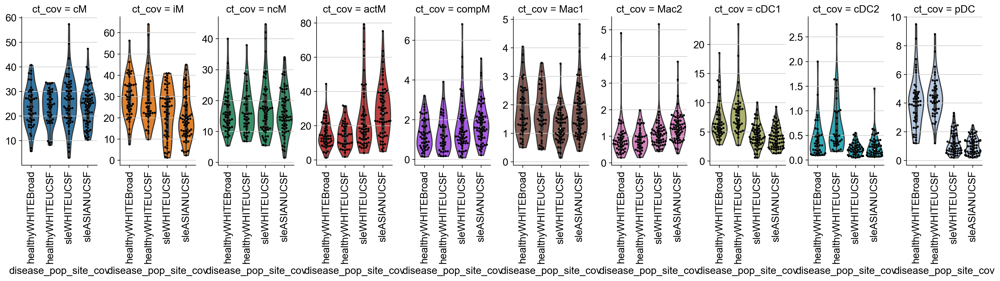

In [83]:
ct_counts=adata.obs.groupby(['ind_cov', 'pop_cov', 'disease_cov', 'batch_cov', 'disease_pop_cov','ct_cov'])['ct_cov'].count()

##ind_count = ind_count.reset_index(name="counts")
ct_counts_sums = ct_counts.groupby(["ind_cov","batch_cov"]).sum()
ct_counts_sums = ct_counts_sums.reset_index(name="counts")

ct_percs = ct_counts/ct_counts.groupby(["ind_cov","batch_cov"]).transform(sum)*100
ct_percs = ct_percs.reset_index(name='ct_percs')

ct_percs.ind_cov = ct_percs.ind_cov.apply(lambda x: x.split('_')[0])
ct_percs.ind_cov = ct_percs.ind_cov.astype("str")
ct_percs.reset_index(inplace=True)
ct_percs.ct_cov = ct_percs.ct_cov.astype("category")
ct_df=ct_percs.unstack(level=2, fill_value=0)

ct_percs['site'] = pd.Categorical(ct_percs.disease_cov, categories=['Broad','UCSF'])
ct_percs.site[ct_percs.batch_cov.str.contains("immvar")] = "Broad"
ct_percs.site[~ct_percs.batch_cov.str.contains("immvar")] = "UCSF"

ct_percs['disease_pop_site_cov'] = pd.Categorical(ct_percs.apply(lambda row: row['disease_cov'] + row['pop_cov'] + row['site'], axis=1),
                                             categories=['healthyWHITEBroad','healthyWHITEUCSF','sleWHITEUCSF','sleASIANUCSF'],
                                             ordered=True)


##plt.figure(figsize=(20,8))
plot=sb.catplot(x='disease_pop_site_cov', y='ct_percs', hue='ct_cov', data=ct_percs, kind='violin', col='ct_cov', dodge=False, aspect=0.5, height=4, sharex=False, sharey=False, palette=adata.uns['leiden_colors'], cut=0) #, palette=sc.pl.palettes.vega_20_scanpy
plot.set_xticklabels(rotation=90)
plot.fig.subplots_adjust(wspace=0.3)

for ct_i in list(range(len(ct_percs.ct_cov.cat.categories))) :
    ct = ct_percs.ct_cov.cat.categories[ct_i]
    sb.swarmplot(x="disease_pop_site_cov", y="ct_percs", data=ct_percs[ct_percs.ct_cov == ct], color="0", size=3, ax=plot.axes[0,ct_i])
    plot.axes[0,ct_i].get_yaxis().label.set_visible(False)

plot.savefig(figdir+"/violin.disease_pop_site_cov.png")
#plt.subplots_adjust(wspace=0.03)

## Let's look at the IFN score now

In [84]:
## Let's grab the clinical and labs data and compare to our single cell estimates
clues_clinical = pd.read_table("v2.clinical.data.txt", index_col=False)
clues_clinical.genotypeid = clues_clinical.genotypeid.apply(lambda x: x.split('_')[0])
clues_clinical.subjectid = clues_clinical.subjectid.astype("str")
joined = ct_percs.join(clues_clinical.set_index('genotypeid'), on='ind_cov')

t1_labs = pd.read_table("T1labs.csv",sep=",")
t1_labs.SubjectID = t1_labs.SubjectID.astype("str")
joined = joined.join(t1_labs.set_index('SubjectID'), on='subjectid')

### test new code
joined.AbsBaso = joined.AbsBaso/1000
joined.AbsEosino = joined.AbsEosino/1000
joined.AbsLympho = joined.AbsLympho/1000
joined.AbsNeutro = joined.AbsNeutro/1000
joined.AbsMono = joined.AbsMono/1000

joined = joined.assign(pbmc = joined.WhiteBloodCell-joined.AbsNeutro-joined.AbsEosino-joined.AbsBaso)

joined[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']] = joined[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']].astype(str)

## now let's add in white blood cell counts for the immvar patients
immvar_pbmc = pd.read_table("immvar.pbmc.csv", index_col=False, sep=",")
immvar_pbmc.pbmc = immvar_pbmc.pbmc - (np.mean(immvar_pbmc.pbmc) - np.mean(joined.pbmc))

## this is not the most efficient code but will suffice for now
for i in list(range(12)) :
    igtb = immvar_pbmc.immvarid[i]
    joined.pbmc[joined.ind_cov==igtb] = immvar_pbmc.pbmc[i]

joined = joined.assign(estimate=joined.ct_percs/100*joined.pbmc)

joined[["ind_cov","disease_pop_site_cov","disease_cov","ct_cov"]] = joined[["ind_cov","disease_pop_site_cov","disease_cov","ct_cov"]].astype(str)
joined.plaquenilnow = joined.plaquenilnow.fillna(0)
joined.cellceptnow = joined.cellceptnow.fillna(0)
joined.steroralnow = joined.steroralnow.fillna(0)
joined.acrlymphopenia = joined.acrlymphopenia.fillna(0)

joined_pivot = joined.pivot_table(index=['ind_cov',"disease_pop_site_cov","disease_cov","pbmc","plaquenilnow","cellceptnow","steroralnow","acrlymphopenia"], columns="ct_cov", values="estimate")
joined_pivot.reset_index(inplace=True)
joined_pivot = joined_pivot[joined_pivot.pbmc > 0]
##joined_pivot.disease_pop_site_cov = pd.Categorical(joined_pivot.disease_pop_site_cov,categories=['healthy','sle'], ordered=True)

# joined_pivot_perc = joined.pivot_table(index=['ind_cov',"disease_cov","pbmc","plaquenilnow","cellceptnow","steroralnow","acrlymphopenia"], columns="leiden", values="ct_percs")
# joined_pivot_perc.reset_index(inplace=True)
# ##joined_pivot = joined_pivot[joined_pivot.pbmc > 0]
# joined_pivot.disease_cov = pd.Categorical(joined_pivot.disease_cov,categories=['healthy','sle'], ordered=True)

/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: read_table is deprecated, use read_csv instead, passing sep='\t'.
  
/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: FutureWarning: read_table is deprecated, use read_csv instead.
  import sys
/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:23: FutureWarning: read_table is deprecated, use read_csv instead.
/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [85]:
#get counts of cells for each cluster
ct_counts=adata.obs.groupby(['ind_cov', 'disease_cov', 'disease_pop_site_cov','ct_cov'])['ct_cov'].count()
ct_percs = ct_counts/ct_counts.groupby(level=[0]).transform(sum)*100
ct_percs = ct_percs.reset_index(name='ct_percs')
ct_percs.ind_cov = ct_percs.ind_cov.apply(lambda x: x.split('_')[0])
ct_percs.ind_cov = ct_percs.ind_cov.astype("str")
ct_percs.reset_index(inplace=True)
ct_percs.ct_cov = ct_percs.ct_cov.astype("category")
ct_df=ct_percs.unstack(level=2, fill_value=0)

##n_cts=ct_df.shape[1]-1
print('as a proportion of cell type')
for ct_i in list(range(0,len(adata.obs.ct_cov.cat.categories))) :
    ct = ct_percs.ct_cov.cat.categories[ct_i]
    ct_perc = ct_percs.ct_percs[ct_percs.ct_cov==ct]
    disease = ct_percs.disease_cov[ct_percs.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    print('Cluster type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Beta='+str(effect)+', pvalue='+str(pval))

# #box plot as a proportion of cell type
# vars=[str(x) for x in list(range(n_cts))]
# ct_df['ind_cov']=ct_df.index.get_level_values('ind_cov').tolist()
# ct_df.index=ct_df['ind_cov']
# melted=pd.melt(ct_df, id_vars=['ind_cov', 'disease'], value_vars=vars)

# #plot=sb.boxplot(x='disease', y='value', hue=ct_arg, data=melted).get_figure()
# plt.figure(figsize=(15,8))
# plot=sb.catplot(x='disease_cov', y='ct_percs', hue='ct_cov', data=ct_percs, kind='violin', col='ct_cov', dodge=False, aspect=0.4, sharex=False, sharey=False, palette=sc.pl.palettes.vega_20_scanpy)
# plot.savefig(figdir+"/violin.ct_cov.png")
# #plt.subplots_adjust(wspace=0.03)

as a proportion of cell type
Cluster type:cM
Beta=-7.4640510862152185, pvalue=1.2128633504453616e-07
Cluster type:iM
Beta=0.47724155789614375, pvalue=0.7786805338903173
Cluster type:ncM
Beta=-5.301209132310113, pvalue=2.691027330363256e-06
Cluster type:actM
Beta=-16.391499822381675, pvalue=8.355852329524021e-13
Cluster type:compM
Beta=-0.8646676465226574, pvalue=1.780581843587619e-08
Cluster type:Mac1
Beta=-0.1842627662467854, pvalue=0.15390762355091503
Cluster type:Mac2
Beta=-0.5909031254024223, pvalue=2.6257636257921935e-09
Cluster type:cDC1
Beta=0.874090588357348, pvalue=0.006362946592786671
Cluster type:cDC2
Beta=0.04999543577555923, pvalue=0.1385336348414763
Cluster type:pDC
Beta=1.8615442745610824, pvalue=1.182197248716676e-24


In [86]:
ifn = pd.read_table("v2.ifn.sig.txt", sep=" ", index_col=False)
ifn.name = ifn.name.apply(lambda x: x.split('_')[0])
joined2 = ifn.join(joined.set_index("ind_cov"), on="name")

joined_pivot2 = joined2.pivot_table(index=['name',"disease_pop_site_cov","pbmc","ifn","plaquenilnow","cellceptnow","steroralnow","acrlymphopenia"], columns="ct_cov", values="estimate")
joined_pivot2.reset_index(inplace=True)

print(joined_pivot2[joined_pivot2.pbmc < 0])
joined_pivot2 = joined_pivot2[joined_pivot2.pbmc > 0]

print(joined_pivot2[joined_pivot2.pbmc > 10])
joined_pivot2 = joined_pivot2[joined_pivot2.pbmc < 10]

##n_cts=ct_df.shape[1]-1
print('as a proportion of cell type')
for ct_i in list(range(0,len(adata.obs.ct_cov.cat.categories))):
    ct = ct_percs.ct_cov.cat.categories[ct_i]
    ct_perc = joined_pivot2[ct]
    ifn = joined_pivot2.ifn
    ifn = sm.add_constant(ifn)
    print('Cluster type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), ifn.astype(float),missing='drop')
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Beta='+str(effect)+', pvalue='+str(pval))

ct_cov       name disease_pop_site_cov   pbmc      ifn  plaquenilnow  \
109     904049200         sleWHITEUCSF -8.083  4.11538           1.0   

ct_cov  cellceptnow  steroralnow  acrlymphopenia      Mac1      Mac2  \
109             0.0          1.0             1.0 -0.131826 -0.055506   

ct_cov      actM      cDC1      cDC2        cM     compM        iM       ncM  \
109    -3.517666 -0.249775 -0.027753 -1.450083 -0.166517 -0.666067 -1.783117   

ct_cov       pDC  
109    -0.034691  
ct_cov       name disease_pop_site_cov    pbmc       ifn  plaquenilnow  \
26           1326         sleASIANUCSF  11.294  1.648588           1.0   
28           1334         sleASIANUCSF  20.685 -1.838448           1.0   
84      900034200         sleWHITEUCSF  10.592 -3.865882           1.0   

ct_cov  cellceptnow  steroralnow  acrlymphopenia      Mac1      Mac2  \
26              1.0          1.0             0.0  0.208665  0.152152   
28              1.0          1.0             0.0  0.107805  0.269511  

/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning: read_table is deprecated, use read_csv instead.
  """Entry point for launching an IPython kernel.


In [87]:
joined_pivot2_percs = joined2.pivot_table(index=['name',"disease_pop_site_cov","pbmc","ifn","plaquenilnow","cellceptnow","steroralnow","acrlymphopenia"], columns="ct_cov", values="ct_percs")
joined_pivot2_percs.reset_index(inplace=True)

print(joined_pivot2_percs[joined_pivot2_percs.pbmc < 0])
joined_pivot2_percs = joined_pivot2_percs[joined_pivot2_percs.pbmc > 0]

print(joined_pivot2_percs[joined_pivot2_percs.pbmc > 10])
joined_pivot2_percs = joined_pivot2_percs[joined_pivot2_percs.pbmc < 10]

##n_cts=ct_df.shape[1]-1
print('as a proportion of cell type')
for ct_i in list(range(0,len(adata.obs.ct_cov.cat.categories))):
    ct = ct_percs.ct_cov.cat.categories[ct_i]
    ct_perc = joined_pivot2_percs[ct]
    ifn = joined_pivot2_percs.ifn
    ifn = sm.add_constant(ifn)
    print('Cluster type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), ifn.astype(float),missing='drop')
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Beta='+str(effect)+', pvalue='+str(pval))


ct_cov       name disease_pop_site_cov   pbmc      ifn  plaquenilnow  \
109     904049200         sleWHITEUCSF -8.083  4.11538           1.0   

ct_cov  cellceptnow  steroralnow  acrlymphopenia      Mac1      Mac2  \
109             0.0          1.0             1.0  1.630901  0.686695   

ct_cov       actM      cDC1      cDC2         cM     compM        iM  \
109     43.519313  3.090129  0.343348  17.939914  2.060086  8.240343   

ct_cov        ncM       pDC  
109     22.060086  0.429185  
ct_cov       name disease_pop_site_cov    pbmc       ifn  plaquenilnow  \
26           1326         sleASIANUCSF  11.294  1.648588           1.0   
28           1334         sleASIANUCSF  20.685 -1.838448           1.0   
84      900034200         sleWHITEUCSF  10.592 -3.865882           1.0   

ct_cov  cellceptnow  steroralnow  acrlymphopenia      Mac1      Mac2  \
26              1.0          1.0             0.0  1.847575  1.347190   
28              1.0          1.0             0.0  0.521173  1.30

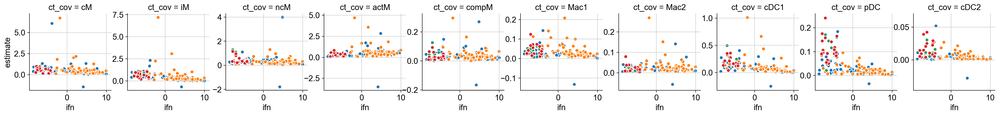

In [88]:
g = sb.FacetGrid(joined2, col="ct_cov",  hue="disease_pop_site_cov", aspect=0.8, height=3, sharex=False, sharey=False, palette=sc.pl.palettes.vega_20_scanpy, col_wrap=10)
g = g.map(plt.scatter, "ifn", "estimate", edgecolor="w")
g.fig.subplots_adjust(wspace=0.2)
g.savefig(figdir+"/ifn.ct_cov.estimates.png")

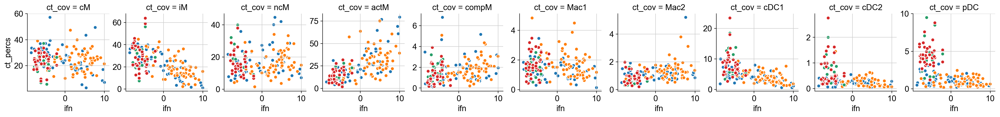

In [89]:
joined2_plot = joined2
joined2_plot.ct_cov = joined2_plot.ct_cov.astype('category')
joined2_plot.ct_cov = joined2_plot.ct_cov.cat.reorder_categories(['cM', 'iM', 'ncM', 'actM', 'compM', 'Mac1', 'Mac2', 'cDC1', 'cDC2', 'pDC'])

g = sb.FacetGrid(joined2_plot, col="ct_cov",  hue="disease_pop_site_cov", aspect=0.8, height=3, sharex=False, sharey=False, palette=sc.pl.palettes.vega_20_scanpy, col_wrap=10)
g = g.map(plt.scatter, "ifn", "ct_percs", edgecolor="w")
g.fig.subplots_adjust(wspace=0.2)
g.savefig(figdir+"/ifn.ct_cov.png")

In [90]:
joined2.sledaiscore = joined2.sledaiscore.fillna(0)
joined2.sliccscore = joined2.sliccscore.fillna(0)
joined2.ifn = joined2.ifn.fillna(0)

In [91]:
joined_pivot3_percs = joined2.pivot_table(index=['name',"disease_pop_site_cov","sledaiscore","sliccscore"], columns="ct_cov", values="ct_percs")

In [92]:
index_df = joined_pivot3_percs.index.to_frame(index=False)
df = joined_pivot3_percs.reset_index(drop=True)
joined_pivot3_percs = pd.merge(index_df, df, left_index=True, right_index=True)

In [93]:
print("Regression with all individuals with healthy controls set to 0 SLEDAI")
for ct_i in list(range(0,len(adata.obs.ct_cov.cat.categories))):
    ct = ct_percs.ct_cov.cat.categories[ct_i]
    
    est=sm.OLS(joined_pivot3_percs.sledaiscore.astype(float),  sm.add_constant(joined_pivot3_percs[ct].astype(float)), missing="drop")
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    cor = joined_pivot3_percs.sledaiscore.corr(joined_pivot3_percs[ct])
    print('Cluster='+str(ct)+', Beta='+str(effect)+', pvalue='+str(pval)+', cor='+str(cor))
    
print("\nRegression with SLE only individuals")

for ct_i in list(range(0,len(adata.obs.ct_cov.cat.categories))):
    ct = ct_percs.ct_cov.cat.categories[ct_i]
    
    sle_only = joined_pivot3_percs[joined_pivot3_percs.disease_pop_site_cov.str.contains("sle")]
    
    est=sm.OLS(sle_only.sledaiscore.astype(float),  sm.add_constant(sle_only[ct].astype(float)), missing="drop")
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    cor = sle_only.sledaiscore.corr(sle_only[ct])
    print('Cluster='+str(ct)+', Beta='+str(effect)+', pvalue='+str(pval)+', cor='+str(cor))
    
    
print("\nRegression with SLE asian individuals")

for ct_i in list(range(0,len(adata.obs.ct_cov.cat.categories))):
    ct = ct_percs.ct_cov.cat.categories[ct_i]
    
    sle_only = joined_pivot3_percs[joined_pivot3_percs.disease_pop_site_cov.str.contains("sleASIANUCSF")]
    
    est=sm.OLS(sle_only.sledaiscore.astype(float),  sm.add_constant(sle_only[ct].astype(float)), missing="drop")
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    cor = sle_only.sledaiscore.corr(sle_only[ct])
    print('Cluster='+str(ct)+', Beta='+str(effect)+', pvalue='+str(pval)+', cor='+str(cor))
    
print("\nRegression with SLE white individuals")

for ct_i in list(range(0,len(adata.obs.ct_cov.cat.categories))):
    ct = ct_percs.ct_cov.cat.categories[ct_i]
    
    sle_only = joined_pivot3_percs[joined_pivot3_percs.disease_pop_site_cov.str.contains("sleWHITEUCSF")]
    
    est=sm.OLS(sle_only.sledaiscore.astype(float),  sm.add_constant(sle_only[ct].astype(float)), missing="drop")
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    cor = sle_only.sledaiscore.corr(sle_only[ct])
    print('Cluster='+str(ct)+', Beta='+str(effect)+', pvalue='+str(pval)+', cor='+str(cor))

Regression with all individuals with healthy controls set to 0 SLEDAI
Cluster=cM, Beta=-0.022871628442669194, pvalue=0.3673138707674938, cor=-0.07220042330715419
Cluster=iM, Beta=-0.08143088099020421, pvalue=1.3804972064631983e-05, cor=-0.3382601460257468
Cluster=ncM, Beta=-0.04389371110968235, pvalue=0.11216541605489161, cor=-0.12687322963297915
Cluster=actM, Beta=0.0757299695143023, pvalue=7.3039391420230995e-09, cor=0.4399426404354581
Cluster=compM, Beta=0.20263996792857547, pvalue=0.3142228891635446, cor=0.08057445980285254
Cluster=Mac1, Beta=-0.435565686807665, pvalue=0.12695917459509584, cor=-0.12232391724389571
Cluster=Mac2, Beta=0.7290375049099458, pvalue=0.048014911037831905, cor=0.15857781228334641
Cluster=cDC1, Beta=-0.24760227218783415, pvalue=0.00037473384303991417, cor=-0.2795568221322283
Cluster=cDC2, Beta=-2.1480128613717966, pvalue=0.0015423053782132614, cor=-0.26707462692927114
Cluster=pDC, Beta=-0.585695293390647, pvalue=6.412480924910184e-07, cor=-0.3849713796158543

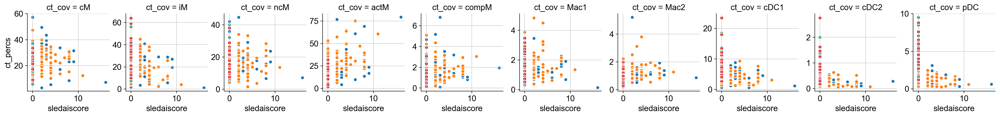

In [94]:
joined3_plot = joined2
joined3_plot.ct_cov = joined3_plot.ct_cov.astype('category')
joined3_plot.ct_cov = joined3_plot.ct_cov.cat.reorder_categories(['cM', 'iM', 'ncM', 'actM', 'compM', 'Mac1', 'Mac2', 'cDC1', 'cDC2', 'pDC'])

g = sb.FacetGrid(joined3_plot, col="ct_cov",  hue="disease_pop_site_cov", aspect=0.8, height=3, sharex=False, sharey=False, palette=sc.pl.palettes.vega_20_scanpy, col_wrap=10)
g = g.map(plt.scatter, "sledaiscore", "ct_percs", edgecolor="w")
g.fig.subplots_adjust(wspace=0.2)
g.savefig(figdir+"/sledaiscore.ct_cov.png")

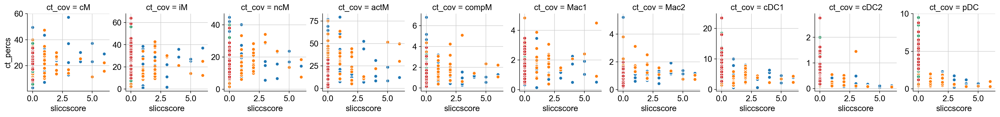

In [95]:
joined3_plot = joined2
joined3_plot.ct_cov = joined3_plot.ct_cov.astype('category')
joined3_plot.ct_cov = joined3_plot.ct_cov.cat.reorder_categories(['cM', 'iM', 'ncM', 'actM', 'compM', 'Mac1', 'Mac2', 'cDC1', 'cDC2', 'pDC'])

g = sb.FacetGrid(joined3_plot, col="ct_cov",  hue="disease_pop_site_cov", aspect=0.8, height=3, sharex=False, sharey=False, palette=sc.pl.palettes.vega_20_scanpy, col_wrap=10)
g = g.map(plt.scatter, "sliccscore", "ct_percs", edgecolor="w")
g.fig.subplots_adjust(wspace=0.2)
g.savefig(figdir+"/sliccscore.ct_cov.png")

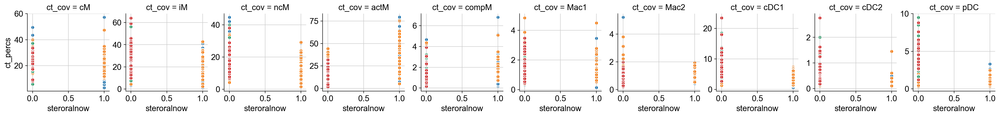

In [96]:
joined3_plot = joined2
joined3_plot.ct_cov = joined3_plot.ct_cov.astype('category')
joined3_plot.ct_cov = joined3_plot.ct_cov.cat.reorder_categories(['cM', 'iM', 'ncM', 'actM', 'compM', 'Mac1', 'Mac2', 'cDC1', 'cDC2', 'pDC'])

g = sb.FacetGrid(joined3_plot, col="ct_cov",  hue="disease_pop_site_cov", aspect=0.8, height=3, sharex=False, sharey=False, palette=sc.pl.palettes.vega_20_scanpy, col_wrap=10)
g = g.map(plt.scatter, "steroralnow", "ct_percs", edgecolor="w")
g.fig.subplots_adjust(wspace=0.2)

# Let's recompute the IFN score

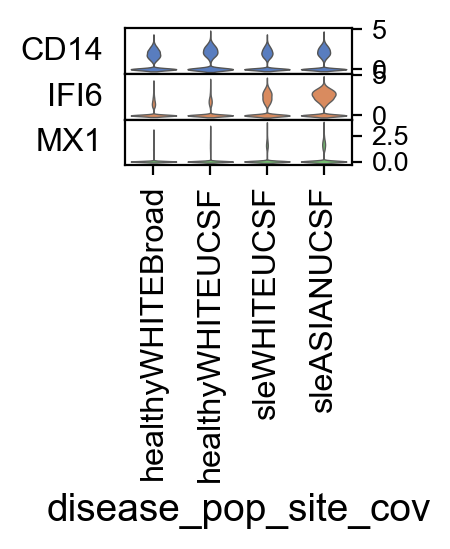

In [80]:
sc.pl.stacked_violin(adata, var_names=['CD14',"IFI6","MX1"], groupby='disease_pop_site_cov', swap_axes=True)

In [144]:
diffexp_annot = pd.read_table("diffexp.annotations.txt", sep="\t", index_col=False)
diffexp_annot.cluster = diffexp_annot.cluster.astype("category")

/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning: read_table is deprecated, use read_csv instead.
  """Entry point for launching an IPython kernel.


In [146]:
for cluster_i in diffexp_annot.cluster.cat.categories:
    print(cluster_i)
    cluster_X = adata.X[:,adata.var_names.isin(diffexp_annot.gene[diffexp_annot.cluster==cluster_i])];
    adata.obs[cluster_i] = np.sum(cluster_X, axis=1)
    

b
lymph
monocytes
myeloid
pan
tc


saving figure to file ./figures.V6/umap.ifn.sle.png
saving figure to file ./figures.V6/umap.ifn.healthy.png


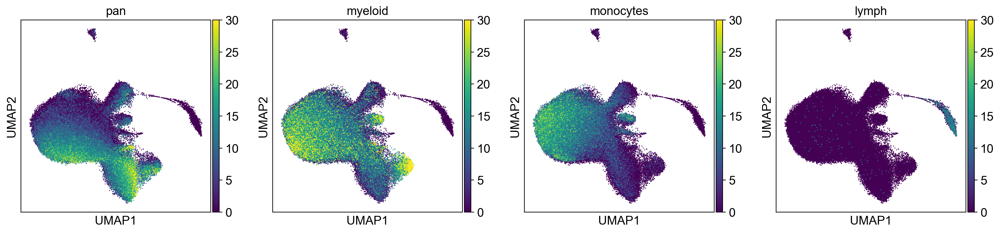

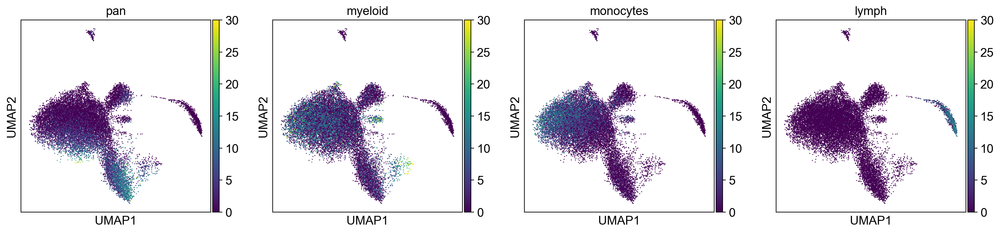

In [179]:
##fig,ax = plt.subplots(nrows=1,ncols=2, figsize=(10,5),sharex=True, sharey=True)
##fig.tight_layout()

sc.pl.umap(adata[adata.obs.disease_cov=="sle"], color=['pan',"myeloid", "monocytes", "lymph"], size=5, vmin=0, vmax=30) ##, vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)
sc.pl.umap(adata[(adata.obs.disease_cov=="healthy") & (adata.obs.Broad == 0)], color=['pan',"myeloid", "monocytes", "lymph"], size=5, vmin=0, vmax=30) ##,vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)
# sc.pl.umap(adata[(adata.obs.disease_cov=="healthy") & (adata.obs.Broad == 1)], color=['all_ifn',"myeloid_ifn","cM_ifn"], palette="Greys", size=10) ##,vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)

sc.pl.umap(adata[adata.obs.disease_cov=="sle"], color=['pan',"myeloid", "monocytes", "lymph"], size=5, save='.ifn.sle.png', vmin=0, vmax=30) ##, vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)
sc.pl.umap(adata[(adata.obs.disease_cov=="healthy") & (adata.obs.Broad == 0)], color=['pan',"myeloid", "monocytes", "lymph"], size=5, save='.ifn.healthy.png', vmin=0, vmax=30) ##,vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)


##sc.pl.umap(adata[adata.obs.disease_cov=="healthy",], color = "all_ifn", ax=ax[1])                                                      

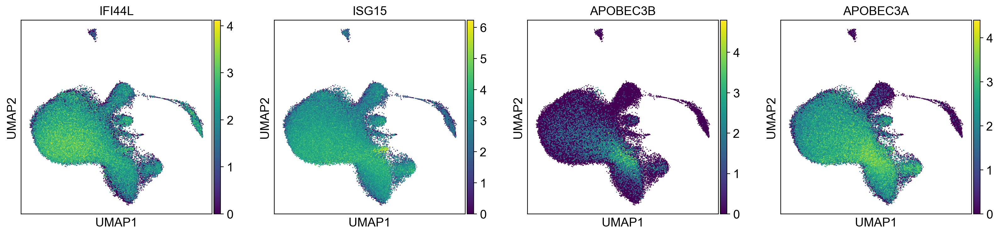

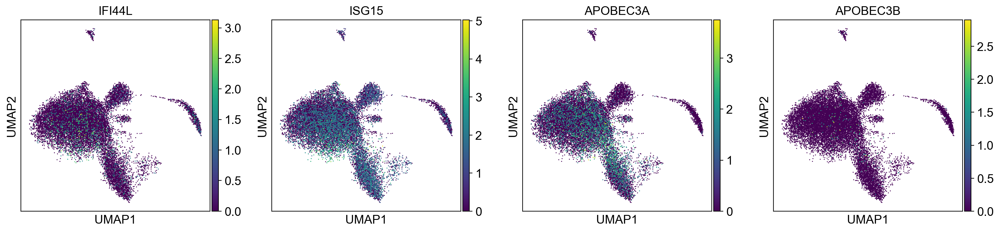

In [150]:
##fig,ax = plt.subplots(nrows=1,ncols=2, figsize=(10,5),sharex=True, sharey=True)
##fig.tight_layout()

sc.pl.umap(adata[adata.obs.disease_cov=="sle"], color=['IFI44L',"ISG15","APOBEC3B","APOBEC3A"], size=5) ##, vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)
sc.pl.umap(adata[(adata.obs.disease_cov=="healthy") & (adata.obs.Broad == 0)], color=['IFI44L',"ISG15","APOBEC3A","APOBEC3B"], size=5) ##,vmin=min(adata.obs.all_ifn), vmax=maex(adata.obs.all_ifn)*.75)
##sc.pl.umap(adata[(adata.obs.disease_cov=="healthy") & (adata.obs.Broad == 1)], color=['IFI44L',"ISG15","APOBEC3B"], size=10) ##,vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)



##sc.pl.umap(adata[adata.obs.disease_cov=="healthy",], color = "all_ifn", ax=ax[1])                                                      

saving figure to file ./figures.V6/umap.types.png


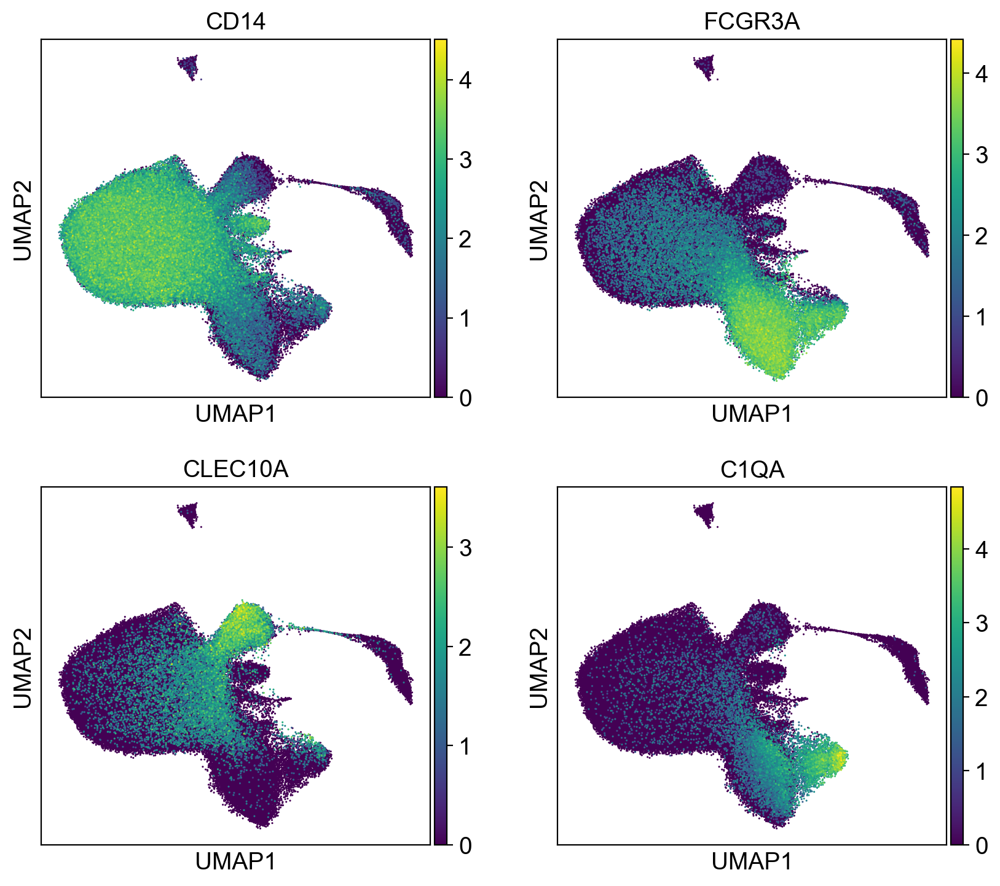

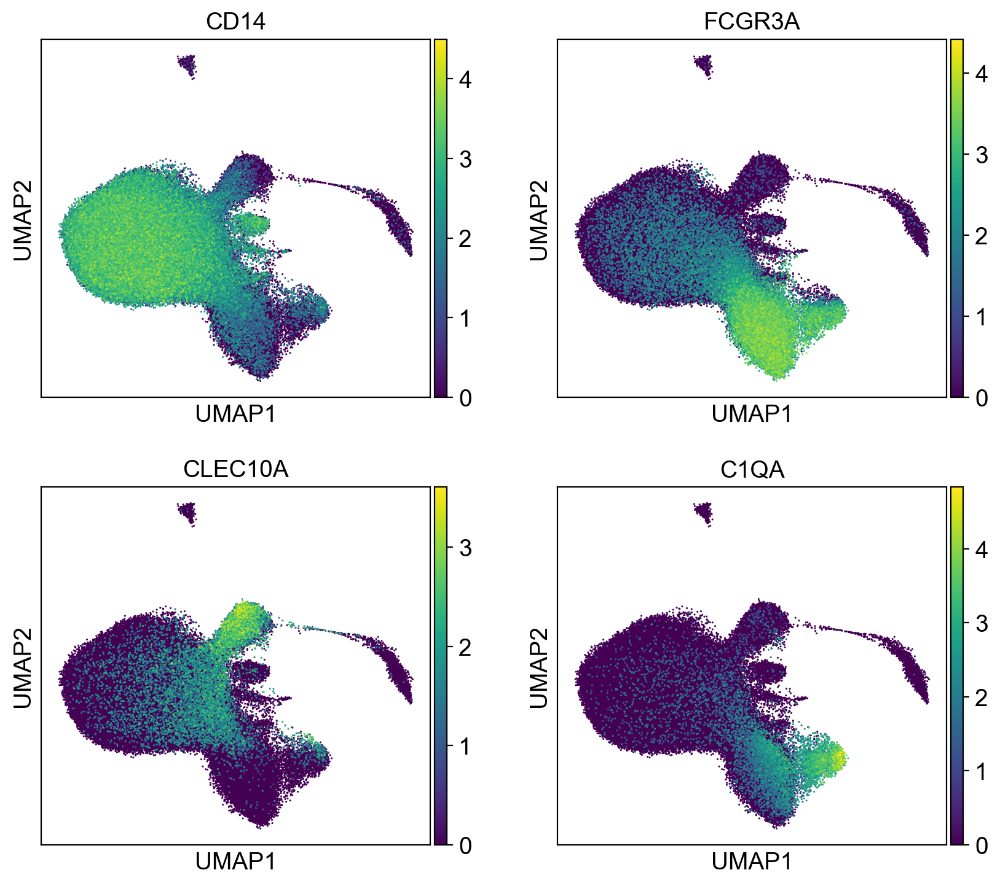

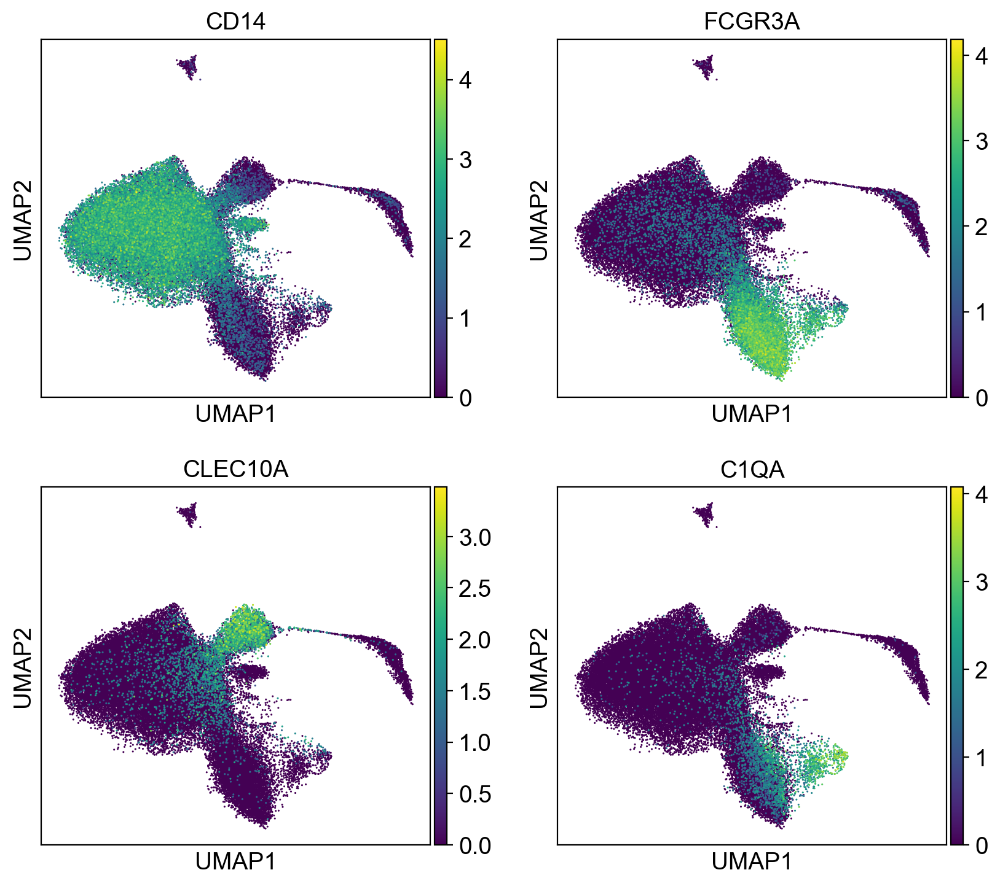

In [151]:
markers = sc.pl.umap(adata, color=['CD14',"FCGR3A","CLEC10A","C1QA"], palette="Greys", size=5,ncols=2) ##, vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)
sc.pl.umap(adata, color=['CD14',"FCGR3A","CLEC10A","C1QA"], palette="Greys", size=5, save='.types.png',ncols=2)
sc.pl.umap(adata[adata.obs.disease_cov=="sle"], color=['CD14',"FCGR3A","CLEC10A","C1QA"], palette="Greys", size=5,ncols=2) ##, vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)
sc.pl.umap(adata[adata.obs.disease_cov=="healthy"], color=['CD14',"FCGR3A","CLEC10A","C1QA"], palette="Greys", size=5,ncols=2) ##,vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)

Cluster=0,Beta=-0.7327387669463361, pvalue=0.05439271904752187
Cluster=1,Beta=-1.7925176067312223, pvalue=4.091775912713724e-09
Cluster=2,Beta=0.7614493872237812, pvalue=0.09830689250982325
Cluster=3,Beta=-1.9834644510121149, pvalue=2.6924910877019777e-06
Cluster=4,Beta=-0.7878163686347748, pvalue=0.2006534819502942
Cluster=5,Beta=-1.9734992239236075, pvalue=1.0922463498488174e-06
Cluster=6,Beta=-0.841709928057164, pvalue=0.14506694958325345
Cluster=7,Beta=-3.6346223149079226, pvalue=1.5619946519806903e-11


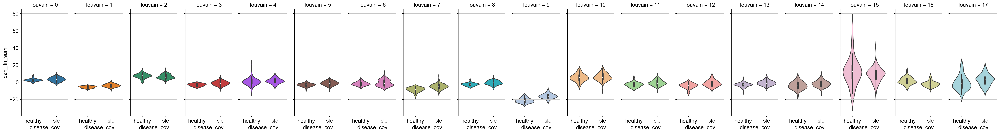

In [156]:
plot_df = adata.obs.groupby(['ind_cov','disease_cov','louvain'])['pan'].mean()
plot_df = plot_df.reset_index(name='pan_ifn_sum')

sb.catplot(x="disease_cov", y="pan_ifn_sum", hue='louvain', data=plot_df, kind='violin', col='louvain', dodge=False, aspect=0.4, sharex=False, sharey=True)

##n_cts=ct_df.shape[1]-1
for cluster_i in list(range(0,8)):
    cluster = plot_df.louvain.cat.categories[cluster_i]
    pan_ifn_sum = plot_df.pan_ifn_sum[plot_df.louvain == cluster]
    disease = plot_df.disease_cov[plot_df.louvain==cluster].astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    est=sm.OLS(pan_ifn_sum.astype(float), disease.astype(float), missing='drop')
    ##est=sm.OLS("all_ifn~disease_cov", data=adata.obs.input,missing='drop')
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Cluster='+str(cluster)+',Beta='+str(effect)+', pvalue='+str(pval))

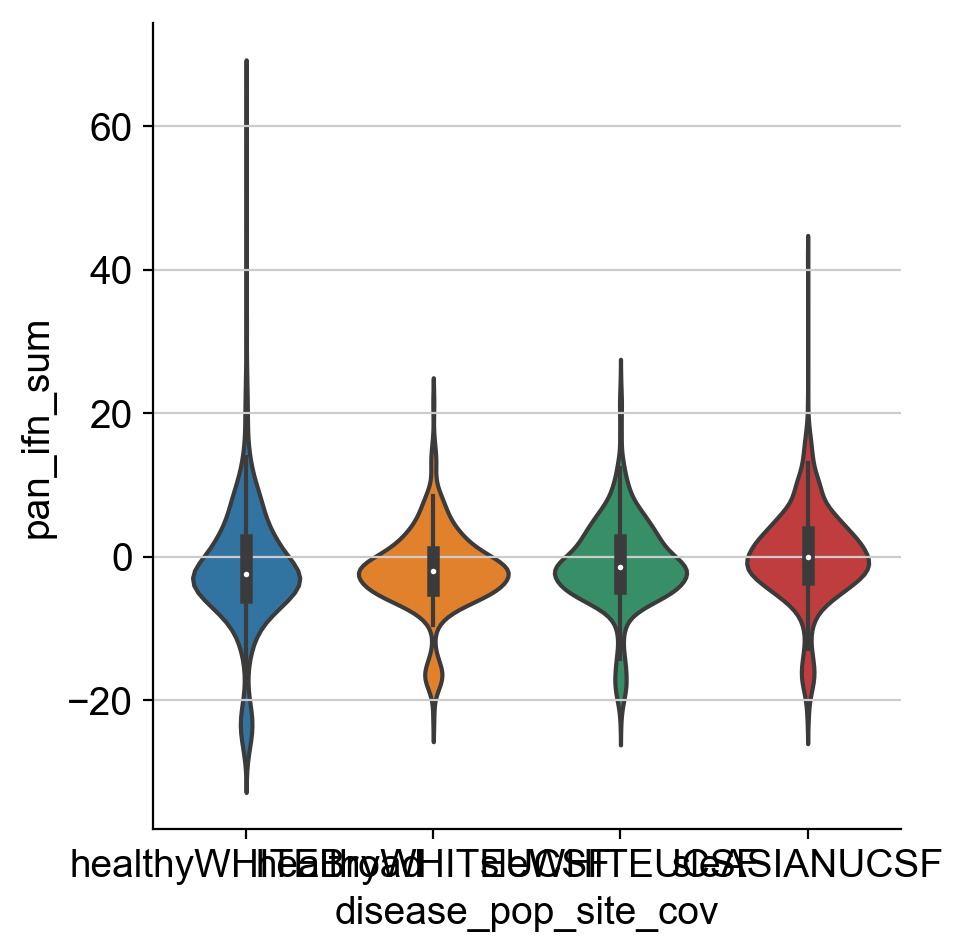

In [163]:
plot_df = adata.obs.groupby(['ind_cov','disease_pop_site_cov','louvain'])['pan'].mean()
plot_df = plot_df.reset_index(name='pan_ifn_sum')

sb.catplot(x="disease_pop_site_cov", y="pan_ifn_sum", data=plot_df, kind='violin', dodge=False, sharex=False, sharey=True)

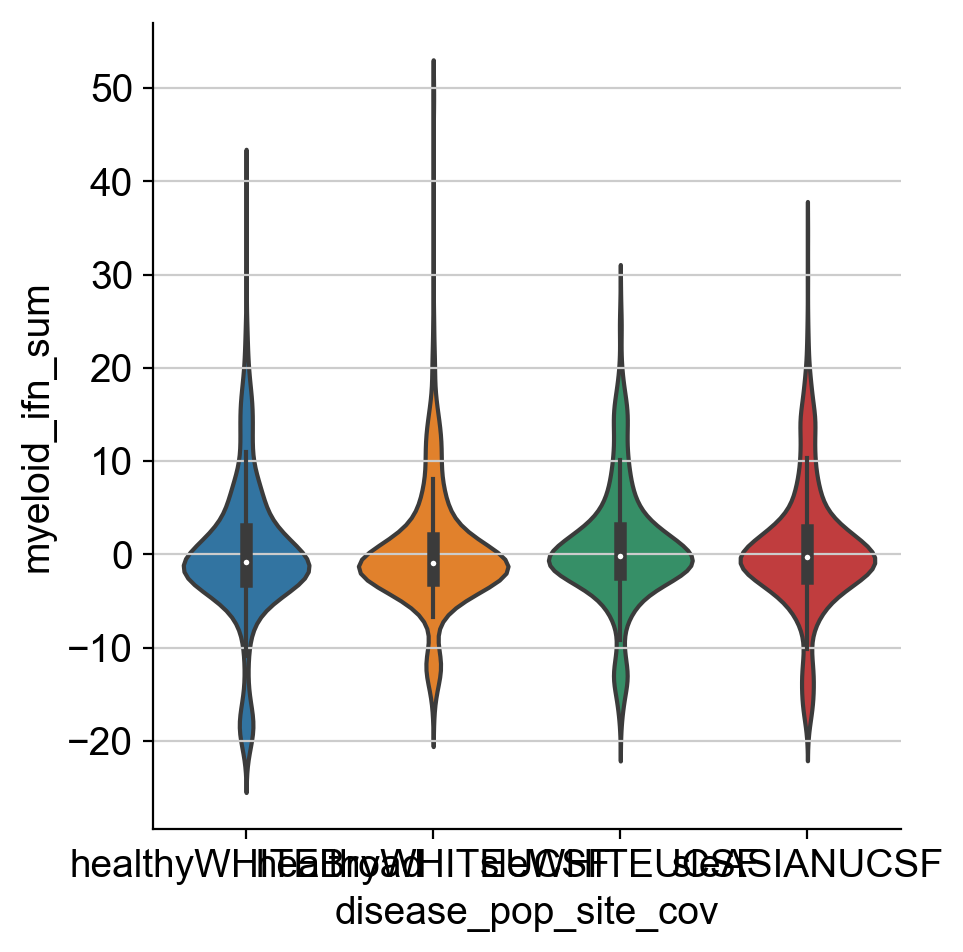

In [164]:
plot_df = adata.obs.groupby(['ind_cov','disease_pop_site_cov','louvain'])['myeloid'].mean()
plot_df = plot_df.reset_index(name='myeloid_ifn_sum')

sb.catplot(x="disease_pop_site_cov", y="myeloid_ifn_sum", data=plot_df, kind='violin', dodge=False, sharex=False, sharey=True)

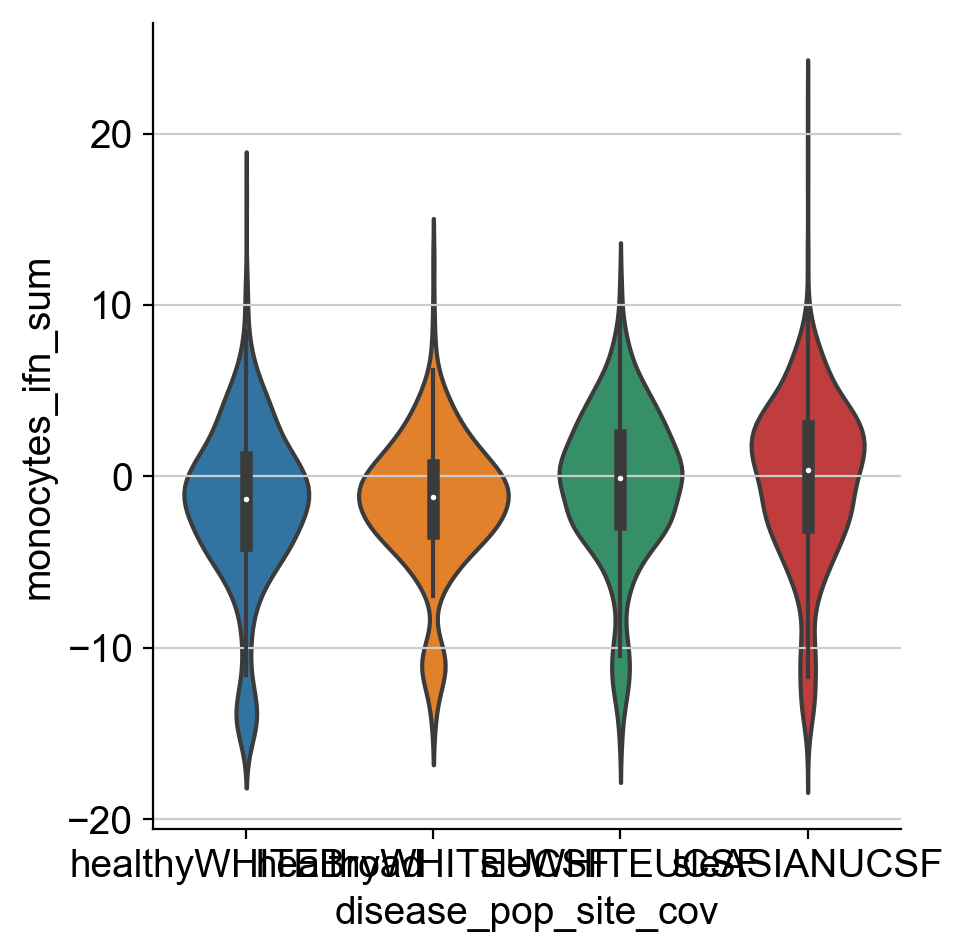

In [165]:
plot_df = adata.obs.groupby(['ind_cov','disease_pop_site_cov','louvain'])['monocytes'].mean()
plot_df = plot_df.reset_index(name='monocytes_ifn_sum')

sb.catplot(x="disease_pop_site_cov", y="monocytes_ifn_sum", data=plot_df, kind='violin', dodge=False, sharex=False, sharey=True)

In [ ]:
plot_df = adata.obs.groupby(['ind_cov','disease_cov','louvain'])['cM_ifn'].mean()
plot_df = plot_df.reset_index(name='cM_ifn_sum')

sb.catplot(x="disease_cov", y="cM_ifn_sum", hue='louvain', data=plot_df, kind='violin', col='louvain', dodge=False, aspect=0.4, sharex=False, sharey=True)

##n_cts=ct_df.shape[1]-1
for cluster_i in list(range(0,8)):
    cluster = plot_df.louvain.cat.categories[cluster_i]
    cM_ifn_sum = plot_df.cM_ifn_sum[plot_df.louvain == cluster]
    disease = plot_df.disease_cov[plot_df.louvain==cluster].astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    est=sm.OLS(cM_ifn_sum.astype(float), disease.astype(float), missing='drop')
    ##est=sm.OLS("cm_ifn~disease_cov", data=adata.obs.input,missing='drop')
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Cluster='+str(cluster)+',Beta='+str(effect)+', pvalue='+str(pval))

In [ ]:
plot_df = adata.obs.groupby(['ind_cov','disease_cov','louvain'])['myeloid_ifn'].mean()
plot_df = plot_df.reset_index(name='myeloid_ifn_sum')

sb.catplot(x="disease_cov", y="myeloid_ifn_sum", hue='louvain', data=plot_df, kind='violin', col='louvain', dodge=False, aspect=0.4, sharex=False, sharey=True)

##n_cts=ct_df.shape[1]-1
for cluster_i in list(range(0,8)):
    cluster = plot_df.louvain.cat.categories[cluster_i]
    myeloid_ifn_sum = plot_df.myeloid_ifn_sum[plot_df.louvain == cluster]
    disease = plot_df.disease_cov[plot_df.louvain==cluster].astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    est=sm.OLS(myeloid_ifn_sum.astype(float), disease.astype(float), missing='drop')
    ##est=sm.OLS("myeloid_ifn~disease_cov", data=adata.obs.input,missing='drop')
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Cluster='+str(cluster)+',Beta='+str(effect)+', pvalue='+str(pval))

## Let's now do DPT

In [43]:
## let's just get a smaller dataset
adata_mono = adata[~adata.obs.ct_cov.isin(["cDC1",'cDC2','pDC','Mac1','Mac2',"compM",'ncM'])].copy()

In [44]:
sc.tl.pca(adata_mono, svd_solver='arpack')

In [45]:
## denoise
sc.tl.diffmap(adata_mono)
sc.pp.neighbors(adata_mono, n_neighbors=10, use_rep='X_diffmap')

computing Diffusion Maps using n_comps=15(=n_dcs)
    eigenvalues of transition matrix
    [1.         0.9360467  0.9251686  0.91094214 0.88153505 0.87785
     0.87438864 0.86624765 0.85994124 0.8562988  0.85395783 0.84725255
     0.84221554 0.8339771  0.82933986]
    finished (0:00:08.35)
computing neighbors
    finished (0:00:35.28)


In [46]:
sc.tl.louvain(adata_mono, resolution=1.0)
sc.tl.paga(adata_mono, groups='louvain')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:21.99)
running PAGA
    finished (0:00:06.25)


    number of colors in `.uns[louvain'_colors']` smaller than number of categories, falling back to palette


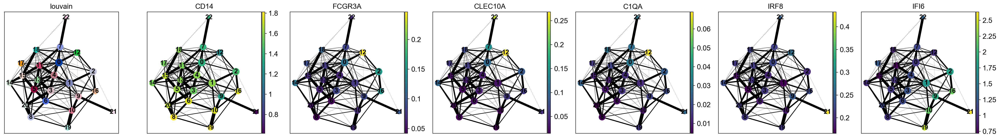

In [47]:
sc.pl.paga(adata_mono, color=['louvain', 'CD14',"FCGR3A","CLEC10A", 'C1QA', 'IRF8', 'IFI6'])

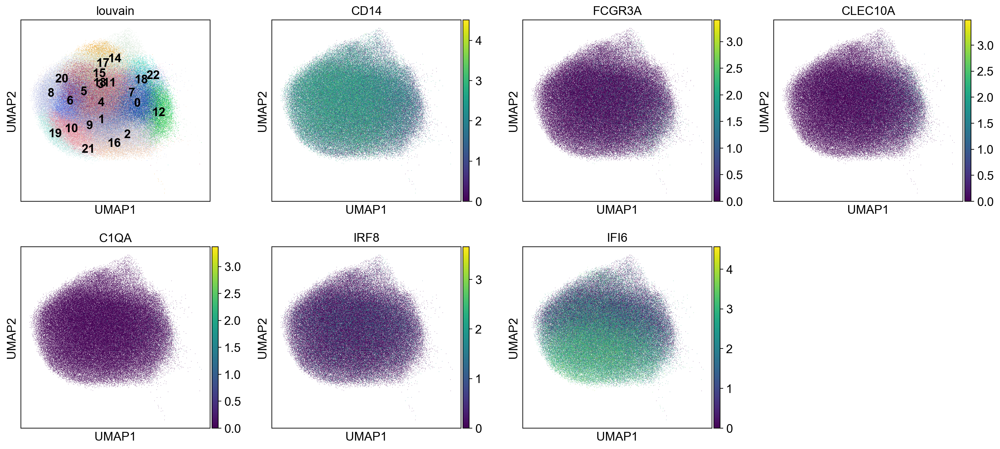

In [48]:
sc.pl.umap(adata_mono, color=['louvain', 'CD14',"FCGR3A","CLEC10A", 'C1QA', 'IRF8', 'IFI6'], legend_loc='on data')

In [70]:
# sc.tl.draw_graph(adata_mono, init_pos='paga')
# sc.pl.draw_graph(adata_mono, color=['louvain', 'CD14',"FCGR3A","CLEC10A", 'C1QA', 'IRF8', 'IFI6'], legend_loc='on data')

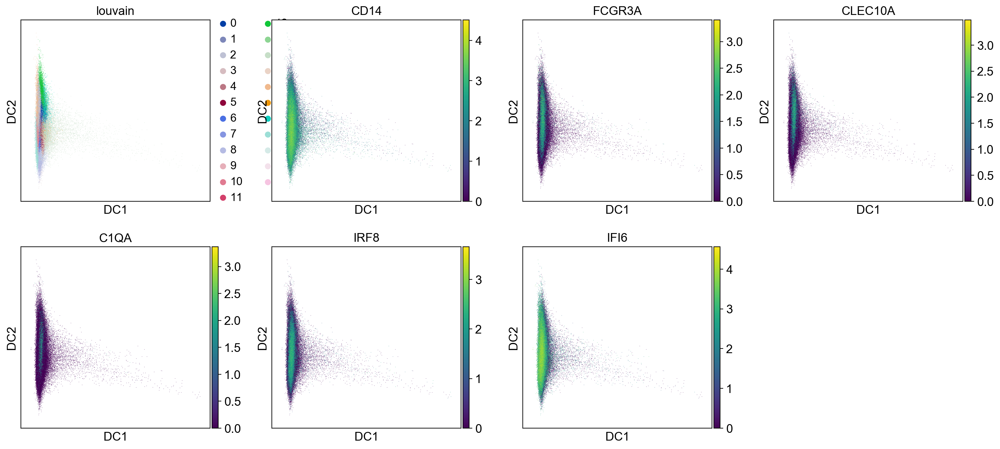

In [69]:
sc.pl.diffmap(adata_mono, color=['louvain', 'CD14',"FCGR3A","CLEC10A", 'C1QA', 'IRF8', 'IFI6'])

In [79]:
adata_mono.uns['iroot'] = np.flatnonzero((adata_mono.obs['louvain']  == '17') | (adata_mono.obs['louvain']  == '14'))[0]
sc.tl.dpt(adata_mono, n_dcs=15)

computing Diffusion Pseudotime using n_dcs=15
    finished (0:00:00.02)


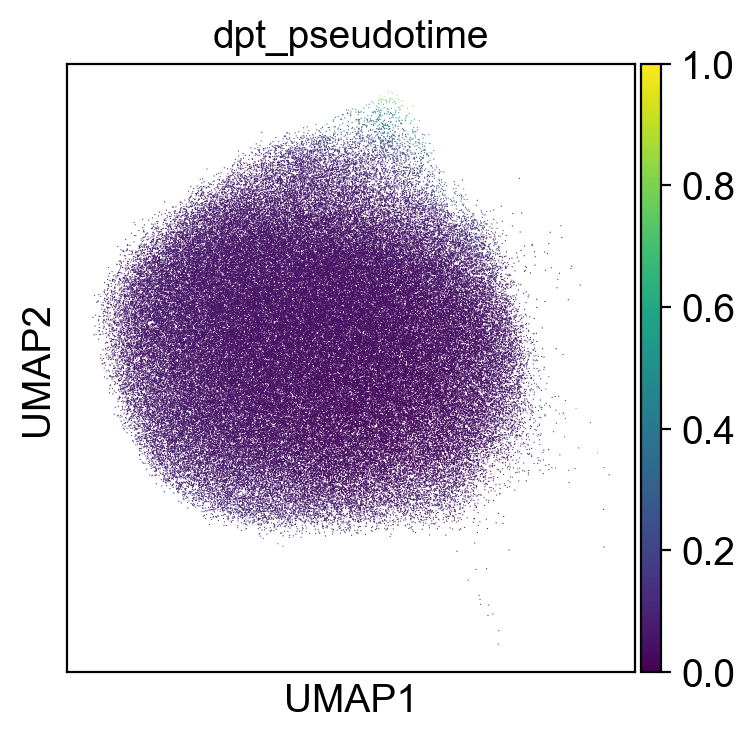

In [80]:
sc.pl.umap(adata_mono, color=['dpt_pseudotime'], legend_loc='on data')

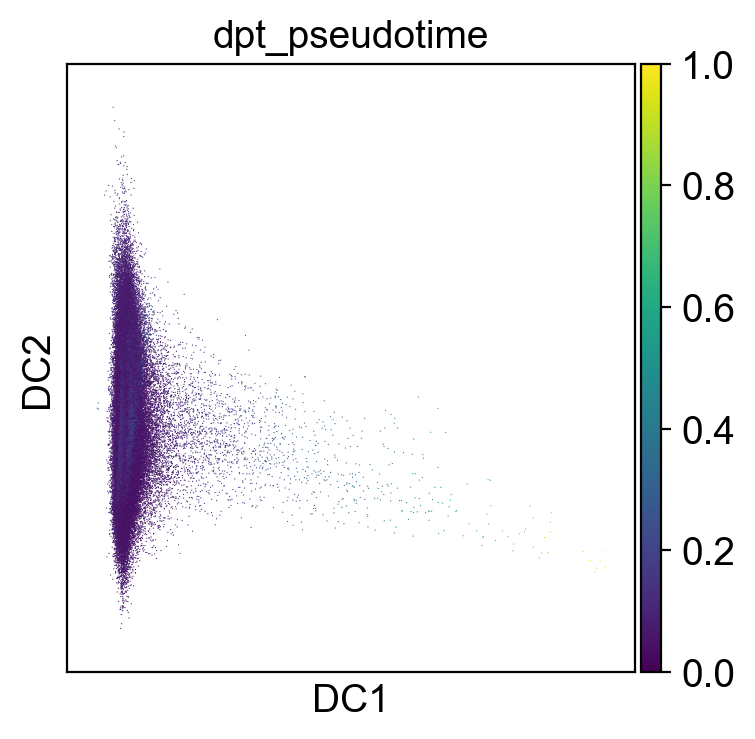

In [50]:
sc.pl.diffmap(adata_mono, color=['dpt_pseudotime'])

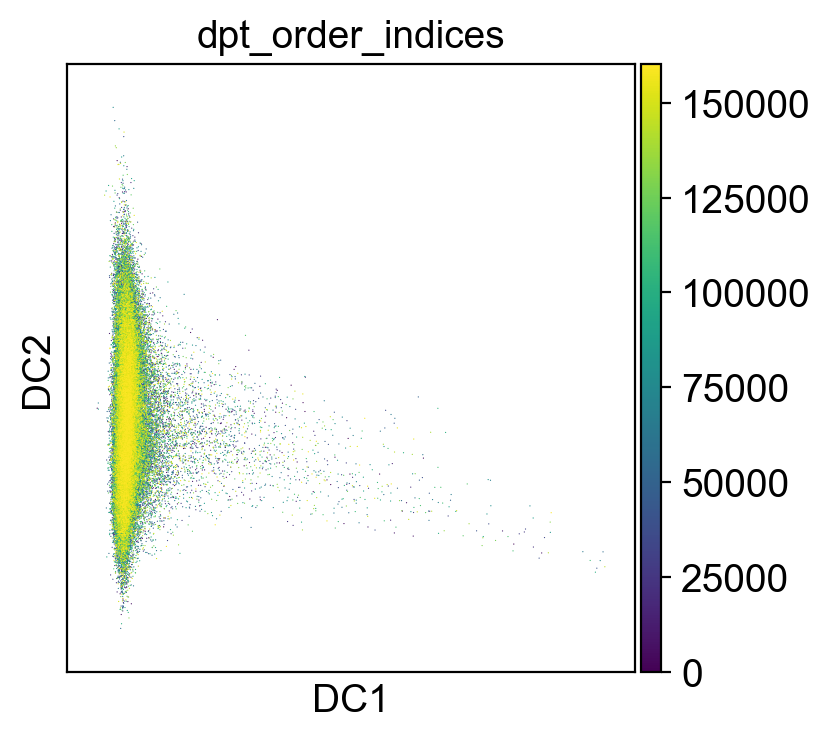

In [51]:
adata_mono.obs['dpt_order_indices'] = adata_mono.obs['dpt_pseudotime'].argsort()
adata_mono.uns['dpt_changepoints'] = np.ones(adata_mono.obs['dpt_order_indices'].shape[0] - 1)
sc.pl.diffmap(adata_mono, color=['dpt_order_indices'])

In [93]:
adata_mono_small = adata_mono[1:100,adata_mono.var_names.isin(["IFI6","MX1"])]

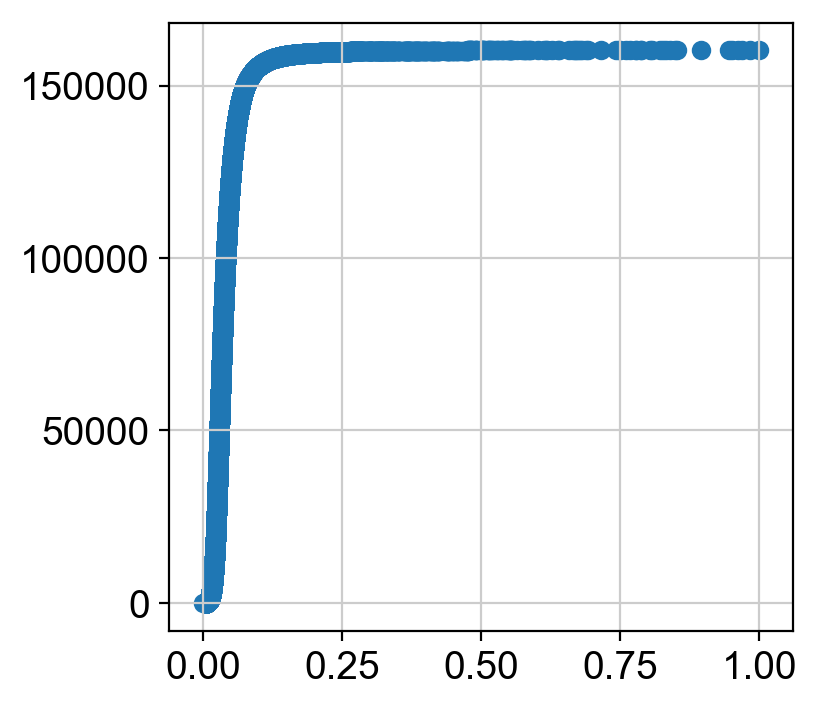

In [94]:
plt.scatter(adata_mono.obs['dpt_pseudotime'], adata_mono.obs['dpt_pseudotime'].rank())

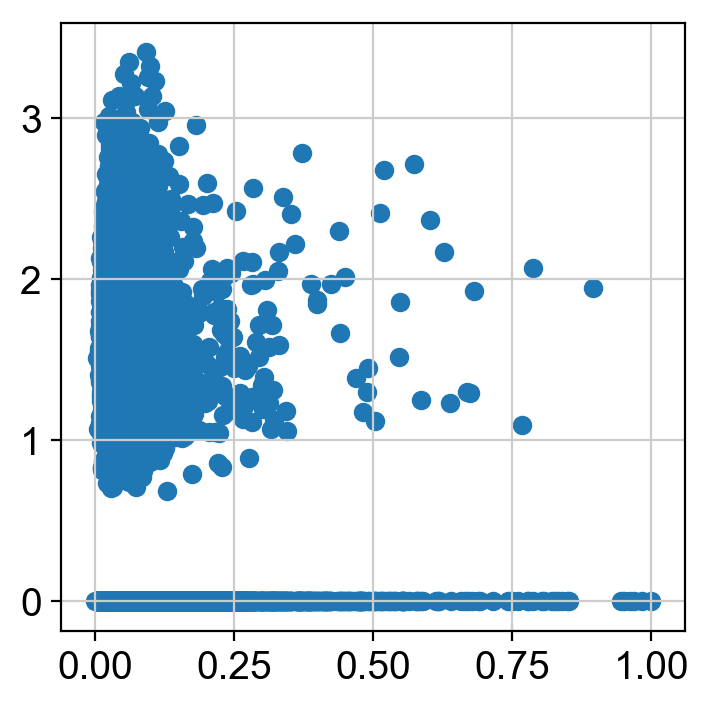

In [95]:
plt.scatter(adata_mono.obs['dpt_pseudotime'], adata_mono.raw[:,"FCGR3A"].X)

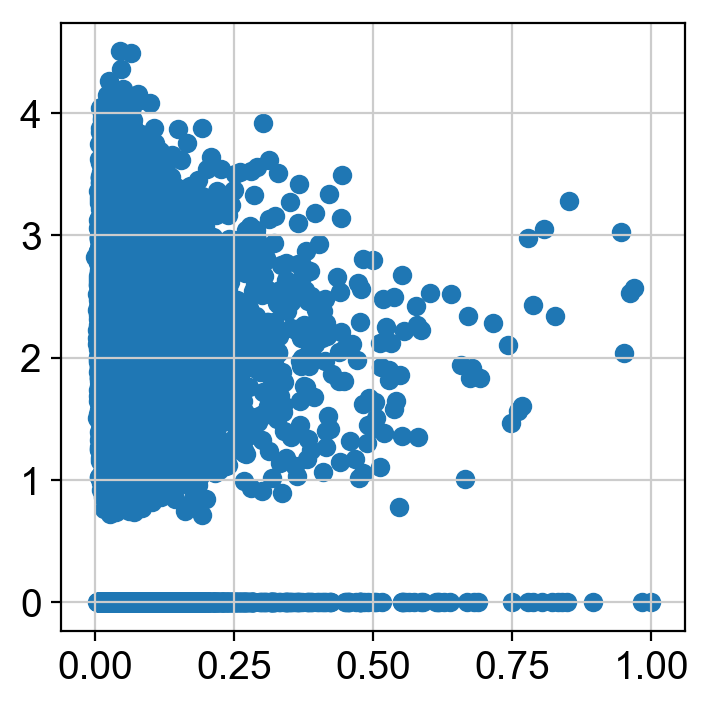

In [96]:
plt.scatter(adata_mono.obs['dpt_pseudotime'], adata_mono.raw[:,"CD14"].X)

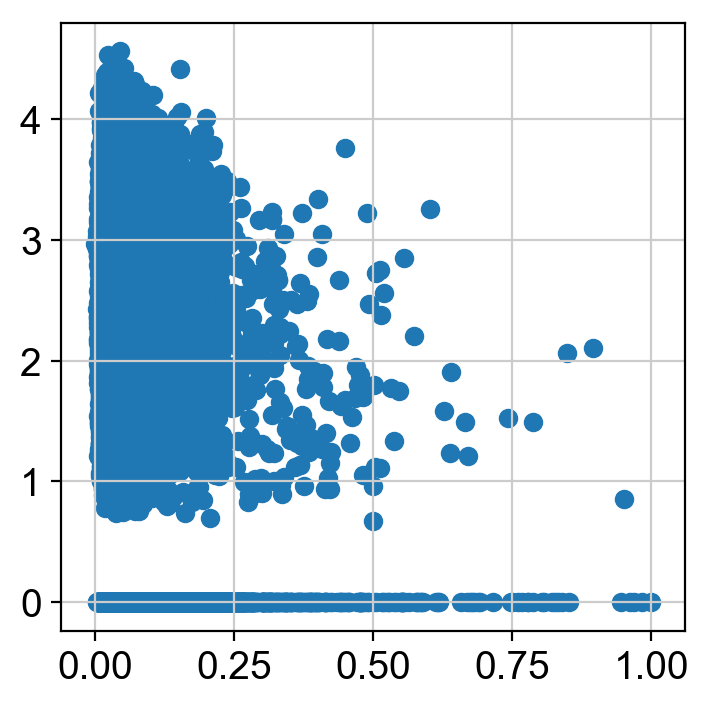

In [97]:
plt.scatter(adata_mono.obs['dpt_pseudotime'], adata_mono.raw[:,"IFI6"].X)

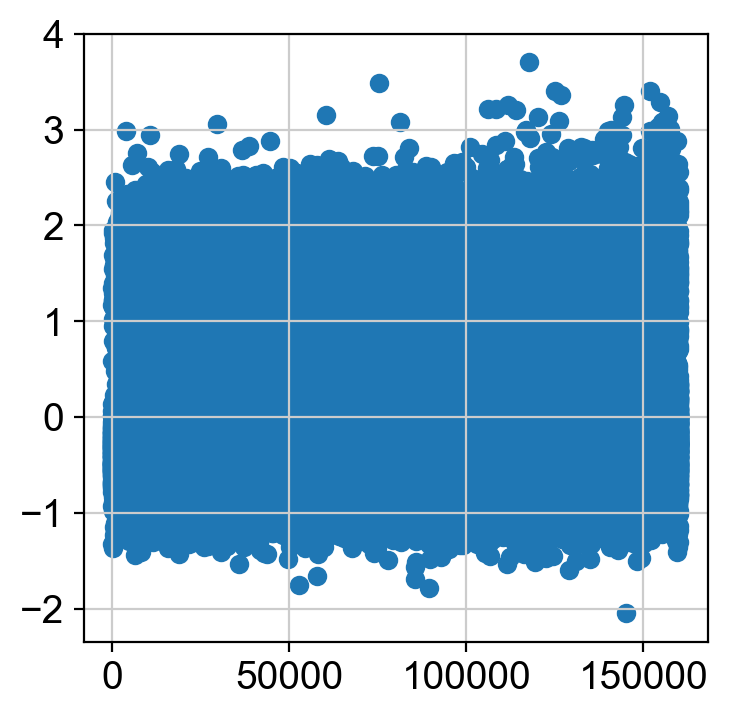

In [98]:
plt.scatter(adata_mono.obs['dpt_pseudotime'].rank(), adata_mono[:,"FCGR3A"].X)

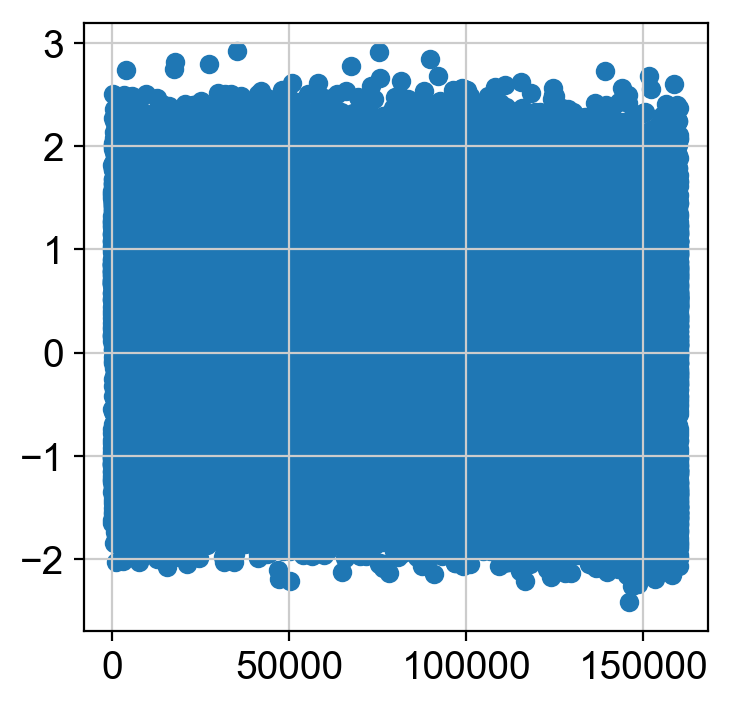

In [99]:
plt.scatter(adata_mono.obs['dpt_pseudotime'].rank(), adata_mono[:,"CD14"].X)

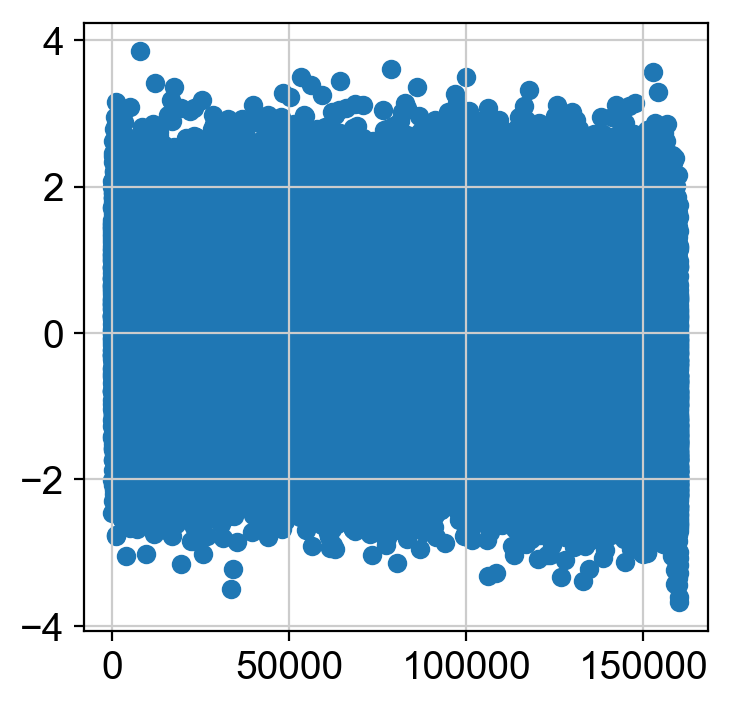

In [100]:
plt.scatter(adata_mono.obs['dpt_pseudotime'].rank(),adata_mono[:,"IFI6"].X)

In [178]:
color_map = [
    '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728',
    '#9467bd', '#8c564b', '#e377c2',
    '#bcbd22', '#17becf',
    '#aec7e8', '#ffbb78', '#98df8a', '#ff9896',
    '#c5b0d5', '#c49c94', '#f7b6d2',
    '#dbdb8d', '#9edae5',
    '#ad494a', '#8c6d31']

data = adata.copy();

# Slice matrix to remove people not in Monocyte results
clues_clinical2 = pd.read_table("v2.clinical.data.txt", index_col=False)
clues_clinical2 = clues_clinical2[clues_clinical2['genotypeid'].isin(data.obs['ind_cov'].values.tolist())]
ifn_genes = pd.read_csv('ifn.lupus.crow.etal.txt', header=None)

genes_lineage = data.var_names[data.var_names.isin(['CD14', 'FCGR3A'])].tolist()
genes_pan_ifn = data.var_names[data.var_names.isin(diffexp_annot.gene[diffexp_annot.cluster.isin(["pan"])])].tolist()
genes_myeloid_ifn = data.var_names[data.var_names.isin(diffexp_annot.gene[diffexp_annot.cluster.isin(["myeloid"])])].tolist()
genes_monocytes_ifn = data.var_names[data.var_names.isin(diffexp_annot.gene[diffexp_annot.cluster.isin(["monocytes"])])].tolist()

##genes_ifn = data.var_names[data.var_names.isin(ifn_genes[0])].tolist()

# Order cells
PC = np.asarray(sc.pp.pca(data[:,genes_lineage].X, n_comps=1, copy=True)).reshape(-1,)
data.obs['PC_axis1'] = list(PC)
PC = np.asarray(sc.pp.pca(data[:,genes_pan_ifn].X, n_comps=1, copy=True)).reshape(-1,)
data.obs['PC_axis2'] = list(PC)
PC = np.asarray(sc.pp.pca(data[:,genes_myeloid_ifn].X, n_comps=1, copy=True)).reshape(-1,)
data.obs['PC_axis3'] = list(PC)
PC = np.asarray(sc.pp.pca(data[:,genes_monocytes_ifn].X, n_comps=1, copy=True)).reshape(-1,)
data.obs['PC_axis4'] = list(PC)

ind_healthy = data.obs['ind_cov'][data.obs['disease_cov']=='healthy'].tolist()
healthyall_axis1 = np.asarray(data.obs['PC_axis1'][data.obs['ind_cov'].isin(ind_healthy)].values.tolist())
healthyall_axis2 = np.asarray(data.obs['PC_axis2'][data.obs['ind_cov'].isin(ind_healthy)].values.tolist())
healthyall_axis3 = np.asarray(data.obs['PC_axis3'][data.obs['ind_cov'].isin(ind_healthy)].values.tolist())
healthyall_axis4 = np.asarray(data.obs['PC_axis4'][data.obs['ind_cov'].isin(ind_healthy)].values.tolist())

# Some SLEDAI scores to cut at
SLEDAI = [np.percentile(clues_clinical2['sledaiscore'].tolist(),25), np.percentile(clues_clinical2['sledaiscore'].tolist(),50), np.percentile(clues_clinical2['sledaiscore'].tolist(),75), np.percentile(clues_clinical2['sledaiscore'].tolist(),100)]
print(SLEDAI)
colors = ['r', 'g', 'k', 'y', 'm']
sleall_axis1 = {};
sleall_axis2 = {};
sleall_axis3 = {};
sleall_axis4 = {};

for ii in range(len(SLEDAI)):
    if ii == SLEDAI[0]:
        disease_sub = clues_clinical2['genotypeid'][clues_clinical2['sledaiscore'] <= SLEDAI[ii]]
    else:
        disease_sub = clues_clinical2['genotypeid'][(clues_clinical2['sledaiscore'] <= SLEDAI[ii]) & (clues_clinical2['sledaiscore'] > SLEDAI[ii-1])]

    ind_sle = data.obs['ind_cov'][data.obs['ind_cov'].isin(disease_sub.values.tolist())].tolist()
    
    sleall_axis1[str(ii)] = np.asarray(data.obs['PC_axis1'][data.obs['ind_cov'].isin(ind_sle)].values.tolist())
    sleall_axis2[str(ii)] = np.asarray(data.obs['PC_axis2'][data.obs['ind_cov'].isin(ind_sle)].values.tolist())
    sleall_axis3[str(ii)] = np.asarray(data.obs['PC_axis3'][data.obs['ind_cov'].isin(ind_sle)].values.tolist())
    sleall_axis4[str(ii)] = np.asarray(data.obs['PC_axis4'][data.obs['ind_cov'].isin(ind_sle)].values.tolist())

## 2D plot

fig,ax = plt.subplots(nrows=1,ncols=5, sharex=True, sharey=True);

for ii in range(len(SLEDAI)):
    plt.subplot(1,5,ii+1);
    p1 = sb.kdeplot(sleall_axis1[str(ii)], sleall_axis2[str(ii)], color=colors[ii], label=str(SLEDAI[ii]), shade=True, shade_lowest=False)
    ax = plt.gca()
    ax.set_title(ii)
    ax.legend()
    ax.set_xlabel('CD14 --> CD16')
    ax.set_ylabel('Low IFN --> Hign IFN')
    ax.axis([-2.5,2.5,-4,5])
    ax.grid(False)
    ##ax.set_aspect('equal')

plt.subplot(1,5,5)
p1 = sb.kdeplot(healthyall_axis1, healthyall_axis2, color="b", label='healthy', shade=True, shade_lowest=False)
ax = plt.gca()
ax.set_title(ii)
ax.legend()
ax.set_xlabel('CD14 --> CD16')
ax.set_ylabel('Low IFN --> Hign IFN')
ax.axis([-2.5,2.5,-4,5])
ax.grid(False)
##ax.set_aspect('equal')

plt.savefig(figdir+'ALLSLEDAI.2D.png', width=15, height=3)
plt.close()

## 1D lineage

fig,ax = plt.subplots();
for ii in range(len(SLEDAI)):
    p1 = sb.kdeplot(sleall_axis1[str(ii)], color=colors[ii], label=str(SLEDAI[ii]), shade=True, shade_lowest=False)
p1 = sb.kdeplot(healthyall_axis1, color="b", label='healthy', shade=True, shade_lowest=False)
ax = plt.gca()
ax.set_title(ii)
ax.legend()
ax.set_xlabel('CD14 --> CD16')
ax.grid(False)
##ax.set_aspect('equal')
plt.savefig(figdir+'ALLSLEDAI.lineage.png', width=5, height=5)
plt.close()

## 1D ifn

fig,ax = plt.subplots();
for ii in range(len(SLEDAI)):
    p1 = sb.kdeplot(sleall_axis2[str(ii)], color=colors[ii], label=str(SLEDAI[ii]), shade=True, shade_lowest=False)
p1 = sb.kdeplot(healthyall_axis2, color="b", label='healthy', shade=True, shade_lowest=False)
ax = plt.gca()
ax.set_title(ii)
ax.legend()
ax.set_xlabel('Low IFN --> Hign IFN')
ax.grid(False)
##ax.set_aspect('equal')
plt.savefig(figdir+'ALLSLEDAI.pan_ifn.png', width=5, height=5)
plt.close()


## 1D ifn

fig,ax = plt.subplots();
for ii in range(len(SLEDAI)):
    p1 = sb.kdeplot(sleall_axis3[str(ii)], color=colors[ii], label=str(SLEDAI[ii]), shade=True, shade_lowest=False)
p1 = sb.kdeplot(healthyall_axis3, color="b", label='healthy', shade=True, shade_lowest=False)
ax = plt.gca()
ax.set_title(ii)
ax.legend()
ax.set_xlabel('Low IFN --> Hign IFN')
ax.grid(False)
##ax.set_aspect('equal')
plt.savefig(figdir+'ALLSLEDAI.myeloid_ifn.png', width=5, height=5)
plt.close()


## 1D ifn

fig,ax = plt.subplots();
for ii in range(len(SLEDAI)):
    p1 = sb.kdeplot(sleall_axis4[str(ii)], color=colors[ii], label=str(SLEDAI[ii]), shade=True, shade_lowest=False)
p1 = sb.kdeplot(healthyall_axis4, color="b", label='healthy', shade=True, shade_lowest=False)
ax = plt.gca()
ax.set_title(ii)
ax.legend()
ax.set_xlabel('Low IFN --> Hign IFN')
ax.grid(False)
##ax.set_aspect('equal')
plt.savefig(figdir+'ALLSLEDAI.monocytes_ifn.png', width=5, height=5)
plt.close()



/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:13: FutureWarning: read_table is deprecated, use read_csv instead, passing sep='\t'.
  del sys.path[0]


Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
[0.0, 2.0, 4.0, 16.0]


[(0, 0.5)]

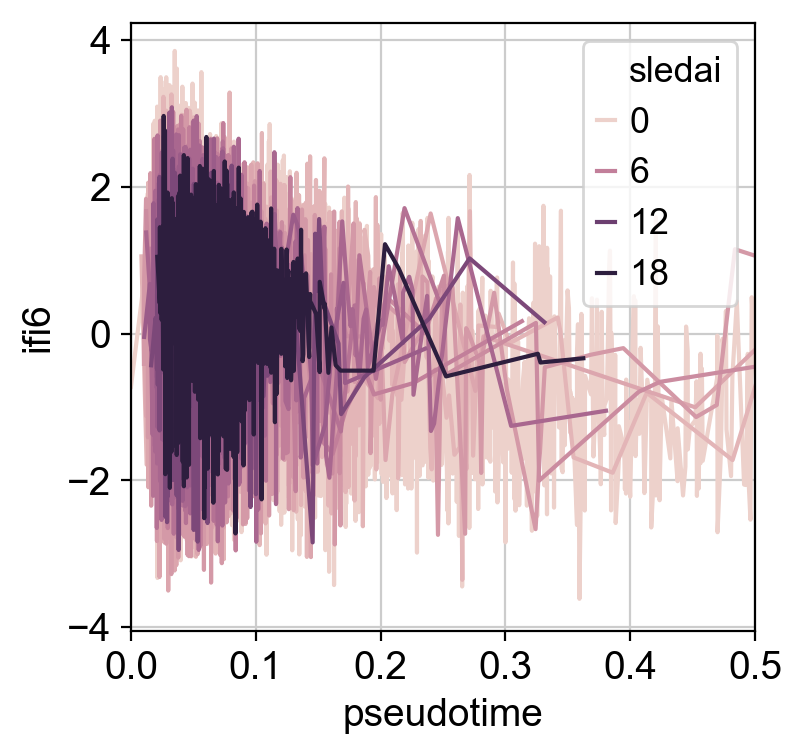

In [88]:
bdata_lineage = pd.DataFrame({"ifi6":np.asarray(adata_mono[:, "IFI6"].X).reshape(-1,), "pseudotime":adata_mono.obs["dpt_pseudotime"], "sledai":adata_mono.obs["SLEDAI"].astype("int64")})
out = sb.lineplot(x="pseudotime", y="ifi6", hue="sledai", data=bdata_lineage)
out.set(xlim=(0,0.5))